<a href="https://colab.research.google.com/github/rcolo88/Advanced-Mchine-Learning-HW4/blob/main/Rob_Cologero_HW4Q1_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pylab inline 
import numpy.linalg as LA
from time import time
import pandas as pd
import os 


Populating the interactive namespace from numpy and matplotlib


# Advanced Machine Learning
# Homework 4
## Homework guideline

- The deadline is May 5th 10:30am. Submission after the deadline will not be graded. 

- Q1-4 are individual homework. 

- Submit your work(your reasoning and your code) as a SINGLE .ipynb document. Please rename the document as _HW1_YOURNAME.ipynb_ (for example, _HW1_FELIX.ipynb_). You are responsible for checking that you have correctly submitted the correct document. If your code cannot run, you may receive NO point.

- For group homework, only one submission is needed and other group members just need to mention which group belong to.  

- Please justify all short answers with a brief explanation.

- You only use the Python packages included in the following cell. You are not allowed to use other advanced package or modules unless you are permitted to. 

- In your final submission include the plots produced by the unedited code as presented below, as well as any additional plots produced after editing the code during the course of a problem. You may find it necessary to copy/paste relevant code into additional cells to accomplish this.

- Feel free to use the lecture notes and other resources.

- Colab is preferred. However, if you use Anaconda, please download the .mat file locally and save it to the same folder as this homework file. 

$\def\m#1{\mathbf{#1}}$
$\def\mb#1{\mathbb{#1}}$
$\def\c#1{\mathcal{#1}}$

# Q1: Theory

## Q1.1 LLE (10pt)
The local covariance matrix $C$ for the particular data point $\m{x}$ is defined as 
$$ C_{jk}=(\m{x}-\eta^{(j)})^\top (\m{x}-\eta^{(k)}) $$
where $\{\eta^{(j)}\}_{j=1}^K$ is $K$-nearest neighbours of $\m{x}$. 

### Q1.1.1 Faster implementation
A much faster way to calculate $C$ is 
\begin{align}
C_{jk} = \frac{1}{2}(D_j+D_k -D_{jk})
\end{align}
where $D_{jk}$ is the square distance between $j$th and $k$th neighbours of $\m{x}$, $D_j$ is the square distance between $\m{x}$ and its $j$-th neighbour.
It requires significantly less user input than the complete matrix of pairwise distances. **Show** this implementation is exactly the local covariance matrix.  


# Your solution:
-$\sum_{j} D_{jk} = \sum_{j}C_{jj} + NC_{jj} → D_{j} = tr(C)/N +C_{jj}
$<br><br>

-$\sum_{k} D_{jk} = \sum_{k}C_{kk} + NC_{kk} → D_{k} = tr(C)/N +C_{kk}
$
<br><br>

-$\sum_{jk} D_{jk} = 2Ntr(C) → \frac{1}{N^{2}}\sum_{jk}D_{jk} = tr(C)/N → D_{0} = 2tr(C)/N
$<br><br>
Now we can work on the covariance matrix.

$
2C_{jk} = C_{jj} + C_{kk} - D_{jk}$<br>$=D_k - tr(C)/N + D_j - tr(C)/N - D_{jk}$<br>$=D_k + D_j -2tr(C)/N - D_{jk}$<br>$=D_k + D_j - D_{jk} -D_0$<br> Dividing by two we get, <br> $C_{jk} = \frac{1}{2}(D_k + D_j - D_{jk})
$



---
### Q1.1.2: (optional) More involved analysis
- Please estimate the upper bound and lower bound percentage of the data entries in the matrix $D$ is used. 

- It is NOT possible to recover manifold structure from even less user input—say, just the pairwise distances between each data point and its nearest neighbor. Please give a counter example. 




# Your solution:



---



## Q1.2 t-SNE (15pt)
- In SNE, the objective function is 
$L(\m{Z}) =\sum_{i}\sum_j P_{j|i}\log\frac{P_{j|i}}{Q_{j|i}}.$

 **Show** the gradient for each embedding vector
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z})= 2\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{j|i}-Q_{j|i}+P_{i|j}-Q_{i|j})
\end{align}

- In symmetric SNE, define 
$P_{ij} = \frac{P_{i|j}+P_{j|i}}{2N}, \ Q_{ij} = \frac{Q_{i|j}+Q_{j|i}}{2N}.$
The objective function is 
$L(\m{Z}) = \sum_{i\ne j} P_{ij}\log\frac{P_{ij}}{Q_{ij}}$.

 **Show** the gradient is 
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z}) =4\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{ij}-Q_{ij})
\end{align}

- In t-SNE, refine $Q_{ij}$ as $Q_{ij}= \frac{(1+\|\m{z}^{(i)}-\m{z}^{(j)}\|^2)^{-1}}{\sum_{k\ne l} (1+\|\m{z}^{(k)}-\m{z}^{(l)}\|^2)^{-1}}$ and leave $P_{ij}$ as is. 

 **Show** the gradient is 
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z}) =4\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{ij}-Q_{ij})(1+\|\m{z}^{(i)}-\m{z}^{(j)}\|^2)^{-1}
\end{align}

# Your solution:
- In SNE, the objective function is 
$L(\m{Z}) =\sum_{i}\sum_j P_{j|i}\log\frac{P_{j|i}}{Q_{j|i}}.$

First, we can rewrite the objective function as follows,
$L(\m{Z}) =\sum_{i}\sum_j p_{j|i} \log p_{j|i}  - p_{j|i} \log q_{j|i}$

Now let $D_{ij} = exp(-\|\ z_{i}-z_{j} \|\ ^{2}) $

Then we have $q_{j|i} = \frac{D_{ij}}{\sum_{j}D_{ij}}  → \frac{D_{ij}}{Z_{i}}$

We now go back to the original cost function and rewrite as follows: $L(\m{Z}) =\sum_{i}\sum_{j} p_{j|i} \log p_{j|i}  - p_{j|i} \log D_{ij} + p_{j|i}logZ_{i}$

We then begin to take the gradient in respect to ${z_i}$, not to be confused with $Z_i$ then we have,

$\rightarrow \frac{\partial L(Z)}{∂z_{i}} = \sum_{i}\sum_{j} -p_{j|i}∂logD_{ij} + \sum_{i}\sum_{j} p_{j|i}∂Z_{i}$

From here. we will split the graident into two parts and combine again later. It's important to not that for all $j\neq i$ the derivative is non zero.
$\sum_{i}\sum_{j} -p_{j|i}∂logD_{ij} = \sum_{j} -p_{j|i}\partial logD_{ij} - p_{i|j}\partial logD_{ji} $ 
$\partial D_{ij} = D_{ij}(-2(z_i-z_j))$<br>Now we can state the following:<br>$\sum_{j}-p_{j|i}\frac{D_{ij}}{D_{ij}}(-2(z_i -z_j)) - p_{j|i}\frac{D_{j|i}}{D_{j|i}}(2(z_I-z_j))$
<br>
$→2\sum_{j}(p_{j|i}+p_{i|j})(z_i-z_j)$ <br> <br>Now let's work on the second part of the earlier equation.<br> It's important to note we have switched around the values of p and Z, however the notation is somewhat arbitrary as the values remain identical.
$\sum_{j}\sum_{i}p_{i|j}\partial log Z_j = \sum_{j}\partial Z_j$
$=\sum_{j}\frac{1}{Z_j}\sum_{i}\partial D_{ji}$
<br>
$=\sum_{j}\frac{D_{ji}}{Z_{j}}(2(z_j - z_i)) + \sum_{j}\frac{D_{ij}}{Z_i}(-2(z_i - z_j))$<br>
$=2\sum_{j}(-q_{j|i}-q_{i|j})(z_i - z_j)$<br>
<br> After comnbining these results, we have the following gradient.
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z})= 2\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{j|i}-Q_{j|i}+P_{i|j}-Q_{i|j})
\end{align}
<br><br>
- In symmetric SNE, the objective function is 
$L(\m{Z}) =\sum_i P_{ij}\log\frac{P_{ij}}{Q_{ij}}.$

First, we can rewrite the objective function as follows,
$L(\m{Z}) =\sum_i p_{ij} \log p_{ij}  - p_{ij} \log q_{ij}$

Now let $D_{ij} = exp(-\|\ z_{i}-z_{j} \|\ ^{2}) $

Then we have $q_{ij} = \frac{D_{ij}}{\sum_{k\neq{l}}D_{ij}}  → \frac{D_{ij}}{Z_{k}}$

Note:$D_{ij} = D_{ji}$ becauSe of symmetry. We can also substitute i,j in for k,l for Z because $Z_k$ does not depend on j,i and $\sum_{i,j} P_{ij}=1$

We now go back to the original cost function and rewrite as follows: $L(\m{Z}) =\sum_{i} p_{ij} \log p_{ij}  - (p_{ji} \log D_{ij} - p_{ji}logZ_{k})$

We then begin to take the gradient in respect to ${z_i}$, not to be confused with $Z_i$ then we have,

$\rightarrow \frac{\partial L(Z)}{∂z_{i}} = \sum_{i} -p_{ji}∂logD_{ij} + \sum_{i} p_{ji}∂Z_{k}$

From here. we will split the graident into two parts and combine again later. It's important to not that for all $j\neq i$ the derivative is non zero.<br><br>
$\sum_{i}\ -p_{ji}∂logD_{ij} = \sum_{j} -p_{ji}\partial logD_{ij} - p_{ij}\partial logD_{ji} $ 
$\sum_{j}-2p_{ji}\partial log{D_{ij}} - p_{ji}\partial{D_{ji}}$
<br>

$→-2\sum_{j}p_{ji}∂logD_{ij}$ <br>
$\partial D_{ij} = D_{ij}(-2(z_i-z_j))$<br>
$-2\sum_jp_{ij}\frac{D_{ij}}{D_{ij}}(-2(z^{i} - z^{j})) → 4\sum_j p_{ij}(z^{i} - z^{j})   $
<br> <br>Now let's work on the second part of the earlier equation.<br> 
$\sum_{i}p_{ij}\partial log Z_k = \sum_j \frac{1}{Z_j}\sum_i\partial D_{ij}$<br>
$=\sum_j \frac{D_{ij}}{Z_j}(2(z^{j}-z^{i})) + \sum_j \frac{D_{ij}}{Z_i}(-2(z^{i}-z^{j}))$<br>
$→2\sum_j(-q_{ij}-q_{ij})(z^{i}-z^{j})$<br>
$→4\sum_j(-q_{ij})(z^{i}-z^{j})$

<br> After comnbining these results, we have the following gradient.
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z})= 4\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{ij}-Q_{ij})
\end{align}

<br><br>

- In T-SNE, the objective function is 
$L(\m{Z}) =\sum_i P_{ij}\log\frac{P_{ij}}{Q_{ij}}.$

First, we can rewrite the objective function as follows,
$L(\m{Z}) =\sum_j p_{ij} \log p_{ij}  - p_{ij} \log q_{ij}$

Now let $D_{ij} = exp(1+\|\ z_{i}-z_{j} \|\ ^{2}) $

Then we have $q_{ij} = \frac{D_{ij}^{-1}}{\sum_{k\neq{l}}D_{ij}^{-1}}  → \frac{D_{ij}^{-1}}{Z}$

Note:$D_{ij} = D_{ji}$ because of symmetry. We can also substitute i,j in for k,l for Z because $Z_k$ does not depend on j,i and $\sum_{i,j} P_{ij}=1$

We now go back to the original cost function and rewrite as follows: $L(\m{Z}) =\sum_{j} p_{ij} \log p_{ij}  - (p_{ji} \log D_{ij}^{-1} - p_{ji}logZ)$

We then begin to take the gradient in respect to ${z_i}$, not to be confused with $Z_i$ then we have,

$\rightarrow \frac{\partial L(Z)}{∂z_{i}} = \sum_{j} -p_{ji}∂logD_{ij}^{-1} + \sum_{j} p_{ji}∂Z$

$→ \sum_j - p_{ij}∂logD_{ij}^{-1} = -2∑_jp_{ji}\partial logD_{ij}^{-1}$<br>

$→ -2\sum_j p_{ij} \frac{D_{ij}^{-2}}{D_{ij}^{-1}}(-2(z^{(i)}-z^{(j)}))$

$→4\sum_j p_{ij}D_{ij}^{-1}(z^{(i)}-z^{(j)})$<br>

Now we move to the second half of the equation.<br>
$\sum_j p_{ij} \partial logZ  = \frac{1}{Z}\sum_j ∂D_{ij}^{-1}$<br>

$→ 2\sum_j \frac{D_{ij}^{-2}}{Z}(-2(z^{(j)}-z^{(i)}))$<br>

$= 4\sum_j -q_{ij} D_{ij}^{-1}(z^{(j)}-z^{(i)})$


<br> After comnbining these results, we have the following gradient.
\begin{align}
\nabla_{\m{z}^{(i)}} L(\m{Z})= 4\sum_j (\m{z}^{(i)}-\m{z}^{(j)})(P_{ij}-Q_{ij})(1 + \|({z}^{(i)}-{z}^{(j)})\|^2)^{-1}
\end{align}









# Q2: t-SNE: early exaggeration (50pt)
One difficulty is that the speed with which t-SNE algorithm converges slows down as the number of points $N$ increases. The algorithm requires many more iterations to converge. In the original paper by Van der Maaten and Hinton, they proposes one way to improve the optimization is called "early exaggeration", 
**multiply all of the $p_{ij}$ by $\alpha$ in the initial stages of the optimization.** In their later paper (2014), 

   "During the first 250 learning iterations, we multiplied all $p_{ij}$ values by
a user-defined constant $\alpha  > 1$. [. . .] this trick enables t-SNE to find a
better global structure in the early stages of the optimization by creating
very tight clusters of points that can easily move around in the embedding
space. In preliminary experiments, we found that this trick becomes
increasingly important to obtain good embeddings when the data set size increases, as it becomes harder for the optimization to
find a good global structure when there are more points in the embedding
because there is less space for clusters to move around. In our experiments,
we fix $\alpha$  = 12." 

### Q2.1: Different parameters
We will perform the early exaggeration methods on the following  MNIST dataset. 

- We will first try with the classical parameter: $\alpha=12$ for the first 250 learning iterations and $\alpha=1$ for the rest learning iterations. The learning rate $h$ (i.e., step-size in the gradient descent) is 200. 

- We will then try a canonical setting for the parameters which the algorithm applied to clustered data converges provably at an exponential rate: $\alpha\sim N/10$ for the first 250 learning iterations and $\alpha=1$ for the rest learning iterations. The learning rate $h$ (i.e., step-size in the gradient descent) is 1. 

For both methods, make sure the initial coordinates $\mathbf{Z}_0$ are the same. You use like `numpy.random.seed(42)` so you'll always get the same random number sequence. 

**Make sure to plot these intermediate steps in the early exaggeration phase!**



### Q2.2: Connection to spectral methods 
The transition matrix $\mathbf{M}$ of the Markov chain is given by
\begin{align}
\mathbf{M}_{ij}=\begin{cases}1- \sum_{k\ne i}P_{ik} & \text{if } i = j\\ P_{ij} & \text{Otherwise} \end{cases}
\end{align}
We propose to visualize the point set after $k$ iterations as follows: start with the same initial coordinates $\mathbf{Z}_0$ as before, and calculate $\mathbf{Z}_k = \mathbf{M}^k \mathbf{Z}_0$ by performing the matrix multiplications. Each row of $\mathbf{Z}_k$ interpretes as coordinates in $\mathbb{R}^2$. This creates t-SNE-style visualizations for spectral methods. Please run this spectral methods for 250 iterations, and plot the embedding result. 
**Make sure to plot these intermediate steps!**

### Q2.3: Compare
- Does t-SNE, in its early exaggeration phase, perform better with the classical parameter choices of $\alpha = 12,h= 200$ than it does with $\alpha \sim N/10, h\sim 1$? 

- Does spectral methods look qualitatively equivalent to the behavior of t-SNE with the parameter choice $\alpha \sim N/10, h\sim 1$ in its early exaggeration phase? 


### Q2.4: Try to embed on 3D (optional)

You can try to embed to three-dimensional space. 


In [ ]:
from sklearn.datasets import load_digits
digits = load_digits() 

X = digits.data
y = digits.target 

X = X[(y==5) | (y==6) | (y==7) | (y==8)|(y==9)]
y = y[(y==5) | (y==6) | (y==7) | (y==8) | (y==9)]
n = X.shape[0]
print("\nThis data set contains " + str(n) + " samples")
print("\nDimensions of the  data set: ")
print(X.shape)


This data set contains 896 samples

Dimensions of the  data set: 
(896, 64)


In [ ]:
def cal_pairwise_dist_sq(X):
  sum_x = sum(square(X), 1)
  dist_matrix_sq = add(add(-2 * dot(X, X.T), sum_x).T, sum_x)
  return dist_matrix_sq

def mysoftmax(X):
    """Compute softmax values for each row of matrix X 
         With the exception on the diagonal."""

    # Subtract max for numerical stability
    e_x = np.exp(X - np.max(X, axis=1).reshape([-1, 1]))
    np.fill_diagonal(e_x, 0.)

    # Add a tiny constant for stability of log we take later
    e_x = e_x + 1e-8  # numerical stability

    return e_x / e_x.sum(axis=1).reshape([-1, 1])

def calc_p_matrix(dist_matrix_sq, sigmas=None):
  """Convert a distances matrix to a matrix of p_{ij}=P_{j|i}."""
  if sigmas is not None:
      two_sig_sq = 2. * np.square(sigmas.reshape((-1, 1)))
      return mysoftmax(-dist_matrix_sq / two_sig_sq)
  else:
      return mysoftmax(-dist_matrix_sq)


In [ ]:
def perplexity(dist_matrix_sq, sigmas=None):
  """Calculate the perplexity of each row
    of a matrix of probabilities."""
  p_matrix = calc_p_matrix(dist_matrix_sq, sigmas)
  entropy = -np.sum(p_matrix * np.log2(p_matrix), 1)
  perplexity = 2 ** entropy
  return perplexity


def binary_search(eval_fn, target, tol=1e-10, max_iter=10000,
                  lower=1e-20, upper=1000.):
  for i in range(max_iter):
    guess = (lower + upper) / 2.
    val = eval_fn(guess)
    if val > target:
      upper = guess
    else:
      lower = guess
    if np.abs(val - target) <= tol:
      break
  return guess

def find_optimal_sigmas(dist_matrix_sq, target_perplexity):
    """For each row of distances matrix, find sigma that results
    in target perplexity for that role."""
    sigmas = []
    # For each row of the matrix (each point in our dataset)
    for i in range(dist_matrix_sq.shape[0]):
        # Make fn that returns perplexity of this row given sigma
        eval_fn = lambda sigma: \
            perplexity(dist_matrix_sq[[i], :], np.array(sigma))
        # Binary search over sigmas to achieve target perplexity
        correct_sigma = binary_search(eval_fn, target_perplexity)
        # Append the resulting sigma to our output array
        sigmas.append(correct_sigma)
    return np.array(sigmas)

In [ ]:
def symmetric_p(P):
  """Given conditional probabilities matrix P, return
    approximation of joint distribution probabilities."""
  return (P+P.T)/(2* P.shape[0])


def calc_p_sne(X, target_perplexity):
  """SNE: Given the data matrix X, compute
  matrix of joint probabilities with entries p_ij."""
  # Get the distances from every point to every other
  X_dist_matrix_sq = cal_pairwise_dist_sq(X)
  # Find optimal sigma for each row of this distances matrix
  sigmas = find_optimal_sigmas(X_dist_matrix_sq, target_perplexity)
  # Calculate the probabilities based on these optimal sigmas
  P_cond = calc_p_matrix(X_dist_matrix_sq, sigmas)
  P = symmetric_p(P_cond)
  return P, sigmas

def KL(P,Q):
    """
    Compute KL-divergence from matrix of high-dimensional probabilities 
    and coordinates of low-dimensional embeddings
    """
    P = P 
    Q = Q + 1e-8
    return sum(P * np.log(P) - P * np.log(Q))


In [ ]:
target_perplexity = 30;
t0= time()
P,sigmas = calc_p_sne(X, target_perplexity)
t1= time()
print("Calculating sigmas and P time: "+str(t1-t0))
print("\nMean sigma = " + str(np.mean(sigmas)))

Calculating sigmas and P time: 7.520240545272827

Mean sigma = 9.964604841444952


In [ ]:
def calc_q_tsne(Z):
  """t-SNE: Given low-dimensional representations Y, compute
  matrix of joint probabilities with entries q_ij."""
  # q_{ij} = (1+\|z_i-z_j\|^2)^{-1} / (\sum_{k\ne l } (1+\|z_k - z_l\|^2)^{-1})
  Z_dist_matrix_sq = cal_pairwise_dist_sq(Z)
  inv_distances = (1+Z_dist_matrix_sq )**(-1) 
  np.fill_diagonal(inv_distances, 0.)
  return inv_distances / np.sum(inv_distances), inv_distances  

def tsne_grad(P, Q, Z, inv_distances):
    """Estimate the gradient of t-SNE cost with respect to Z."""
    #  4 \sum_j (z_i-z_j)(P_{ij} - Q_{ij}) * (1+\|z_i-z_j\|^2)^{-1}
    pq_diff = P - Q
    pq_expanded = np.expand_dims(pq_diff, 2)
    Z_diffs = np.expand_dims(Z, 1) - np.expand_dims(Z, 0)

    # Expand our inv_distances matrix so can multiply by y_diffs
    distances_expanded = np.expand_dims(inv_distances, 2)

    # Multiply this by inverse distances matrix
    Z_diffs_wt = Z_diffs * distances_expanded

    # Multiply then sum over j's
    grad = 4. * (pq_expanded * Z_diffs_wt).sum(1)
    return grad

Running Gradient Descent: 

At step 0, KL divergence =63.88260105298936


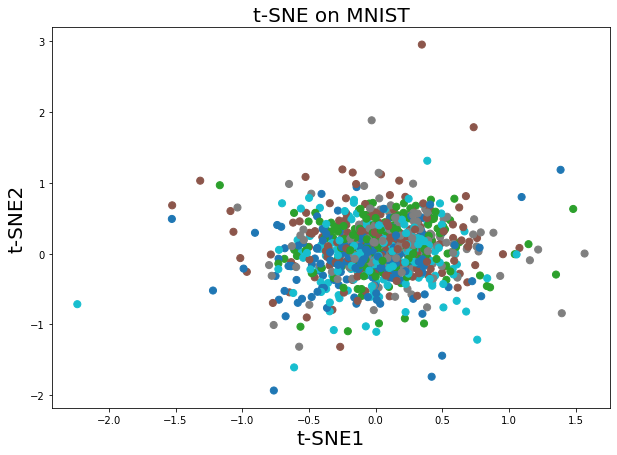

At step 10, KL divergence =65.17905817381148


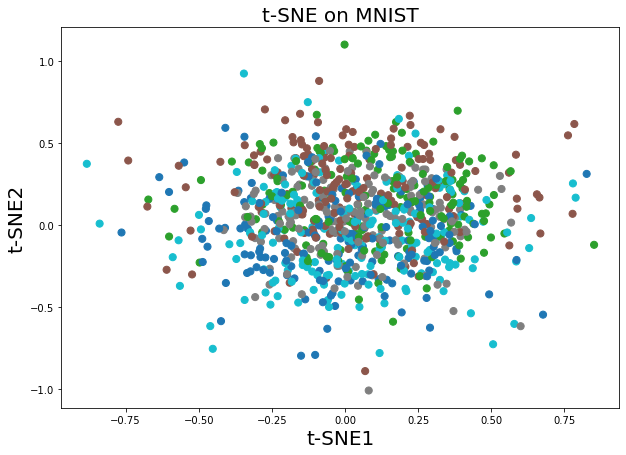

At step 20, KL divergence =64.91481460215905


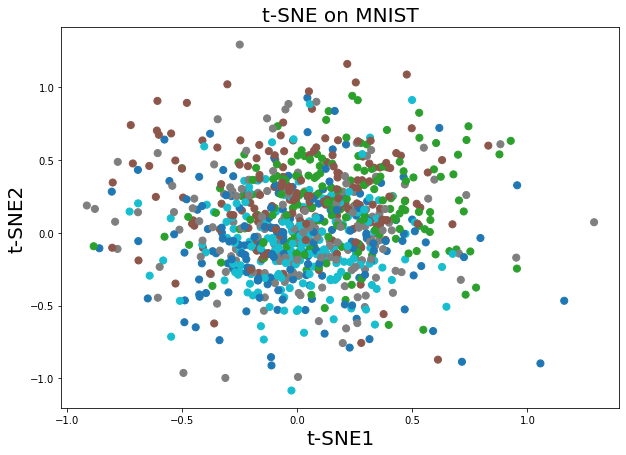

At step 30, KL divergence =64.88254979378195


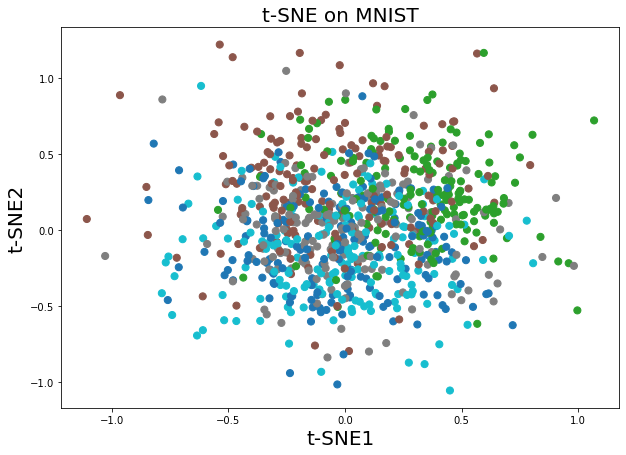

At step 40, KL divergence =64.66586124764441


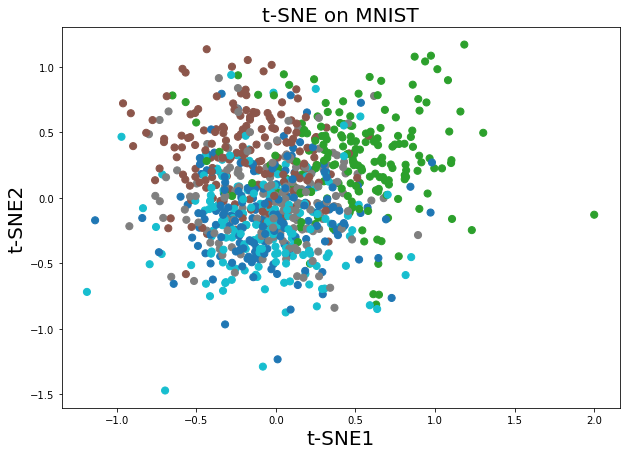

At step 50, KL divergence =64.1287297098672


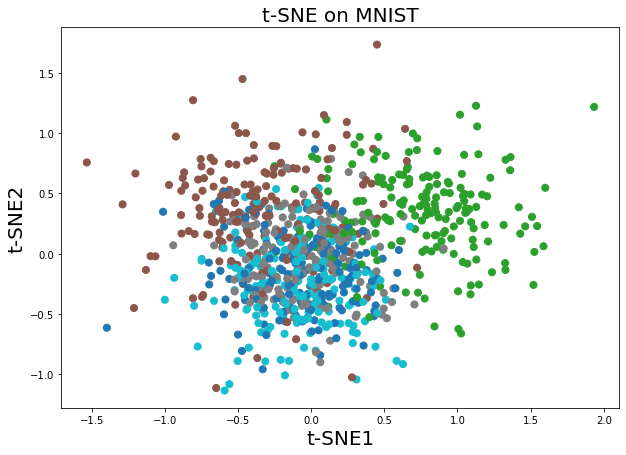

At step 60, KL divergence =63.98748649626726


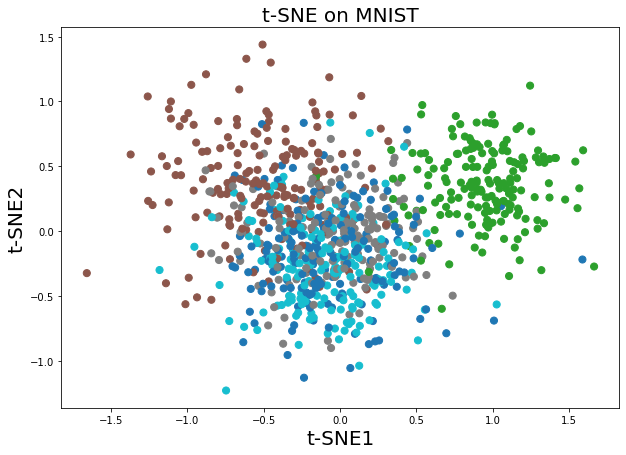

At step 70, KL divergence =63.79362461405938


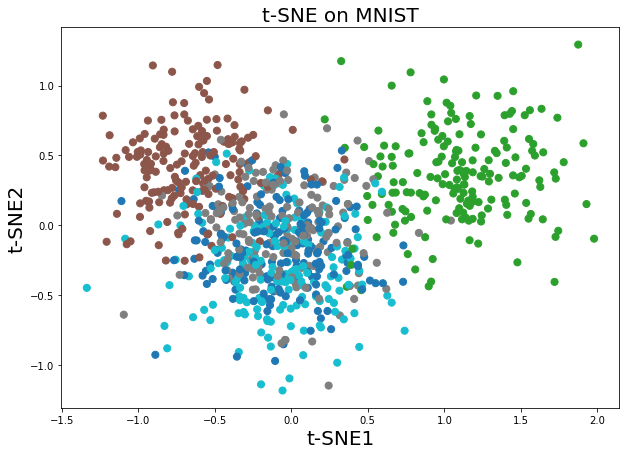

At step 80, KL divergence =63.824199000339604


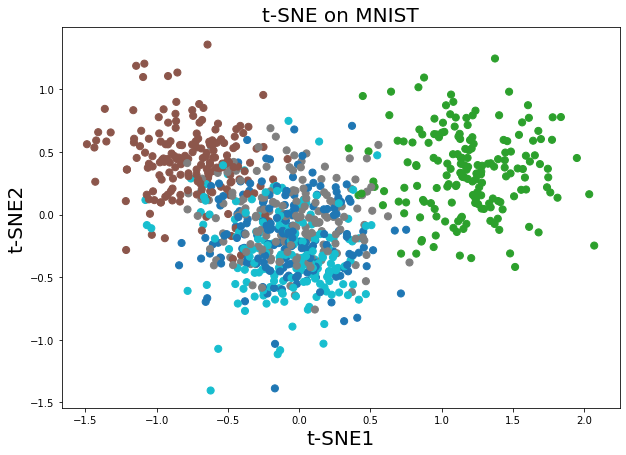

At step 90, KL divergence =63.4389011704432


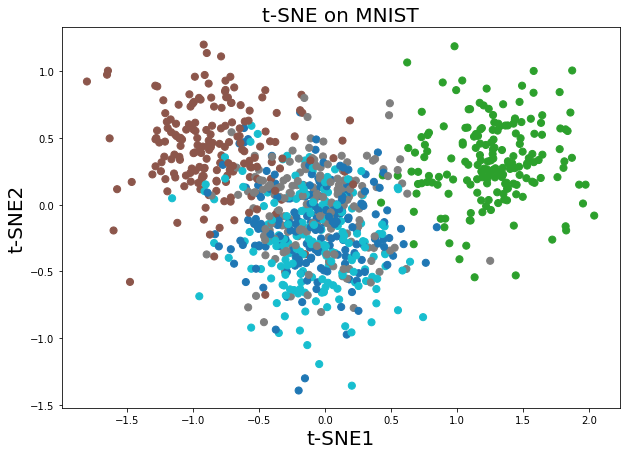

At step 100, KL divergence =63.39219773029837


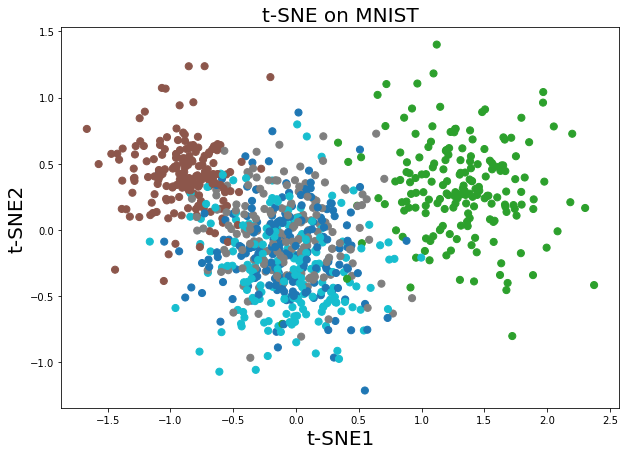

At step 110, KL divergence =63.16315280641831


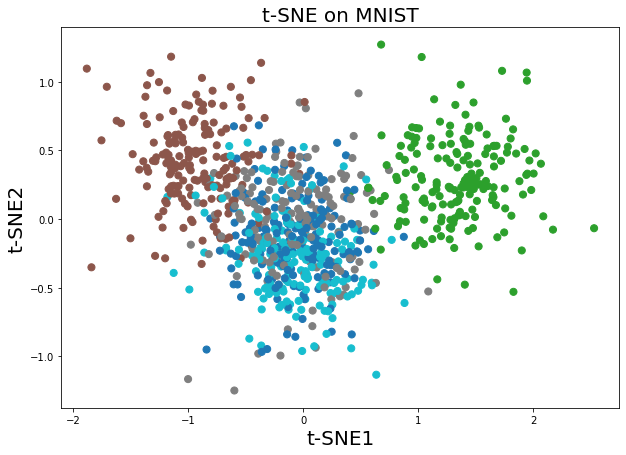

At step 120, KL divergence =63.168318907335355


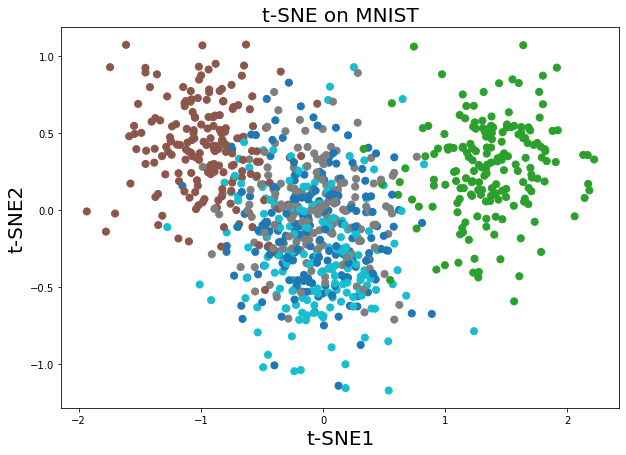

At step 130, KL divergence =63.30546728269583


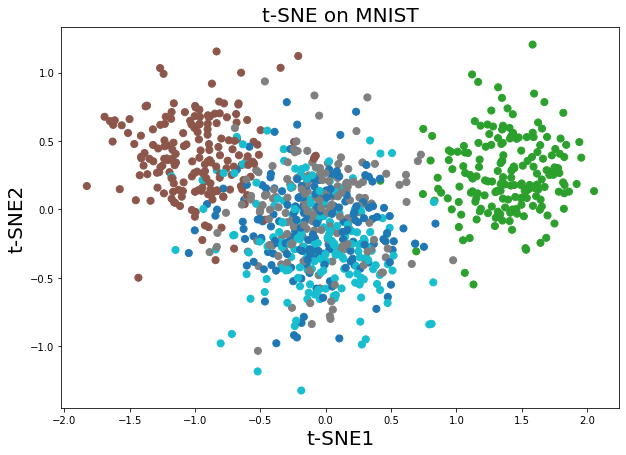

At step 140, KL divergence =62.90217202713122


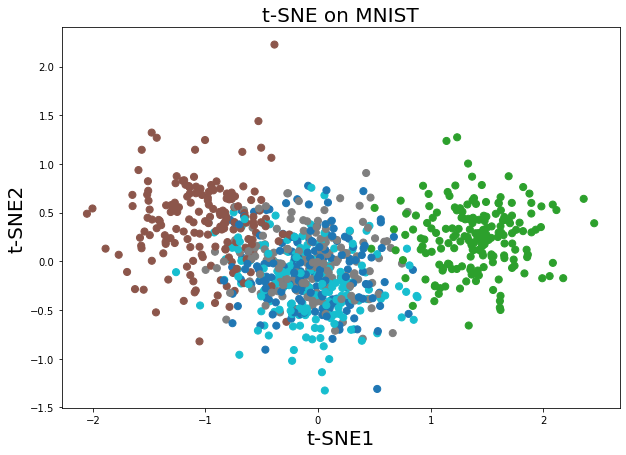

At step 150, KL divergence =63.25832124375333


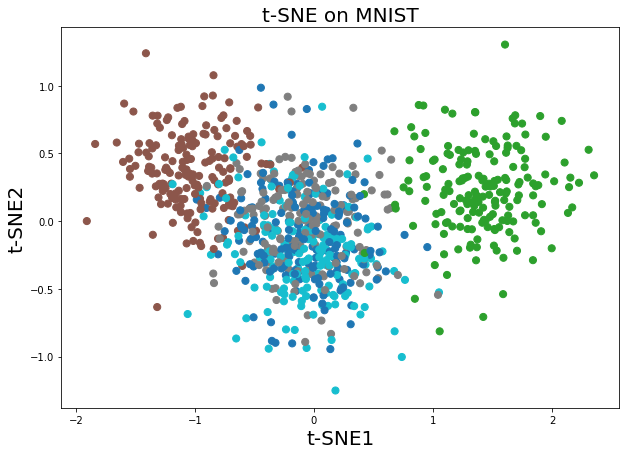

At step 160, KL divergence =63.0372583428313


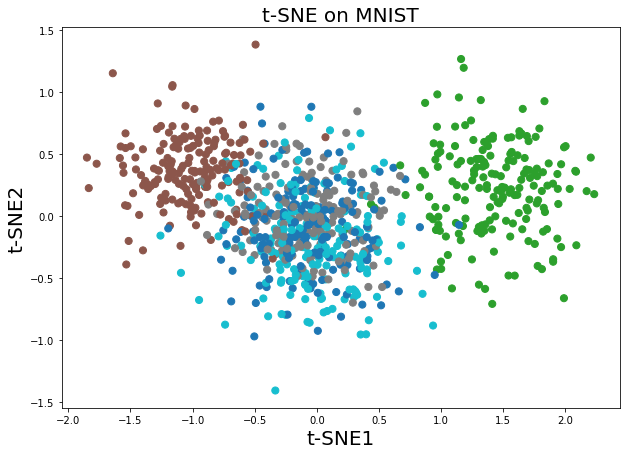

At step 170, KL divergence =63.0440410396464


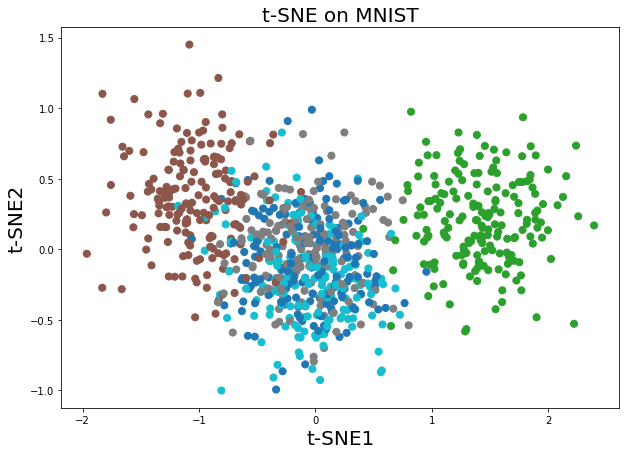

At step 180, KL divergence =63.10059174410849


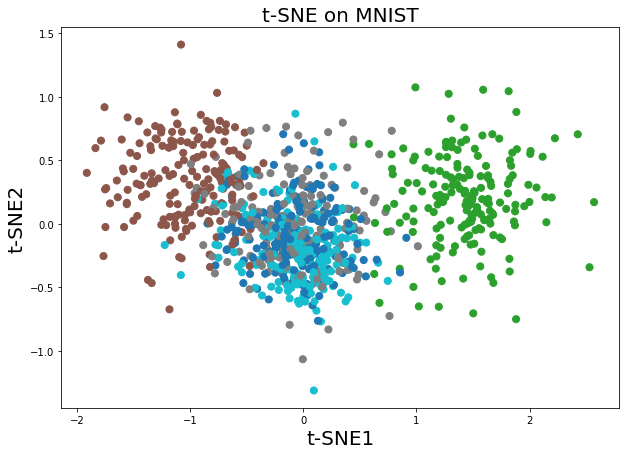

At step 190, KL divergence =63.00386332666001


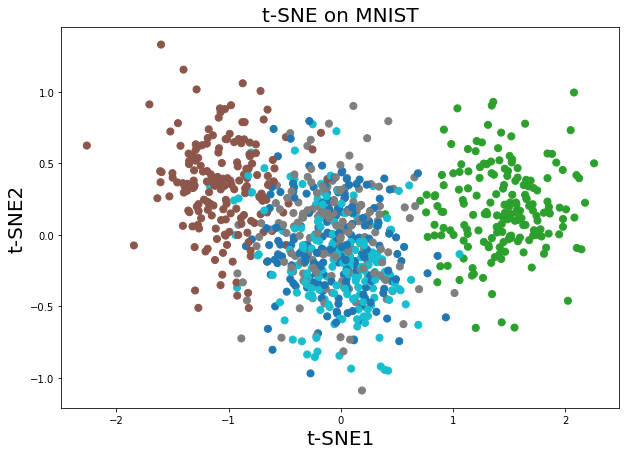

At step 200, KL divergence =63.44667099932529


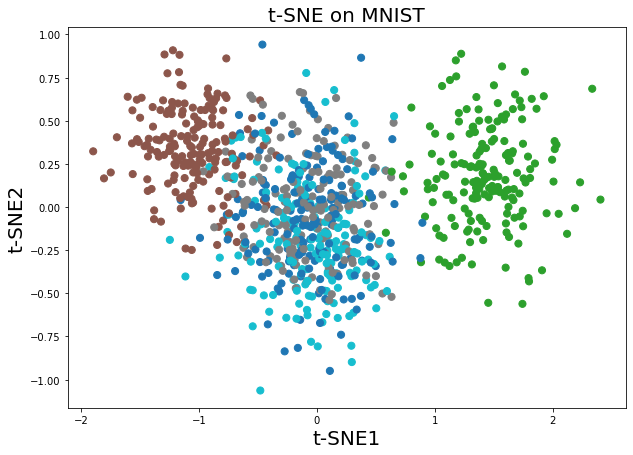

At step 210, KL divergence =62.72010276942263


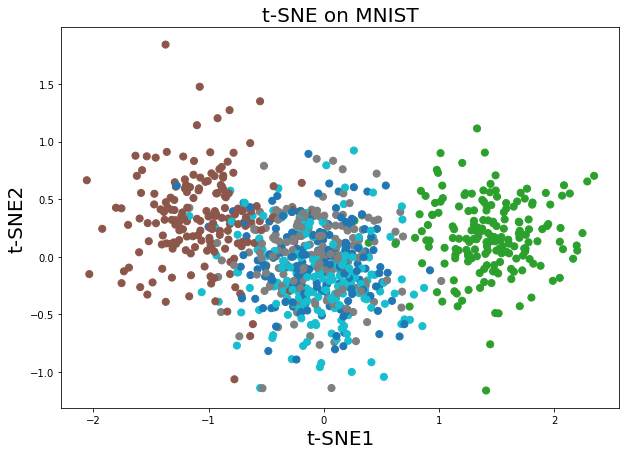

At step 220, KL divergence =63.33567977727671


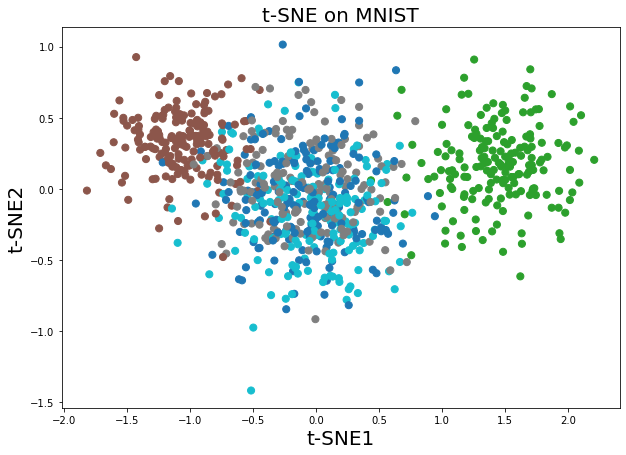

At step 230, KL divergence =63.305868329525914


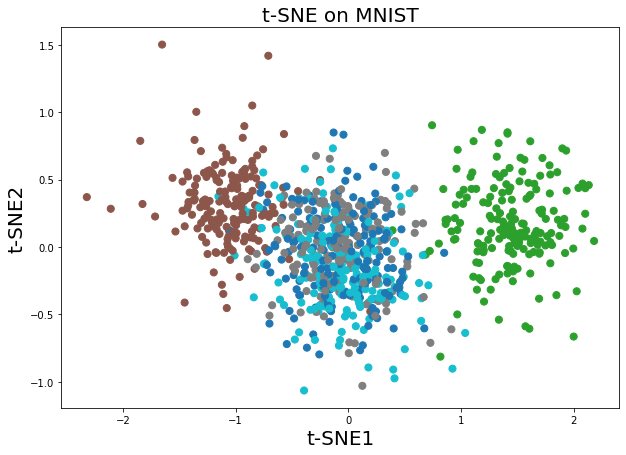

At step 240, KL divergence =62.997753100532556


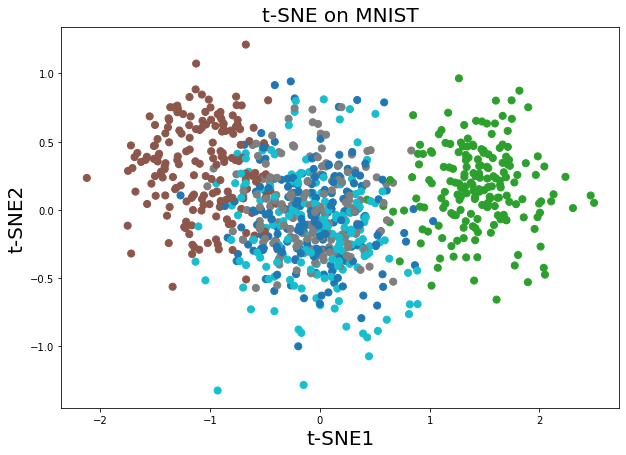

At step 250, KL divergence =2.7640245409936437


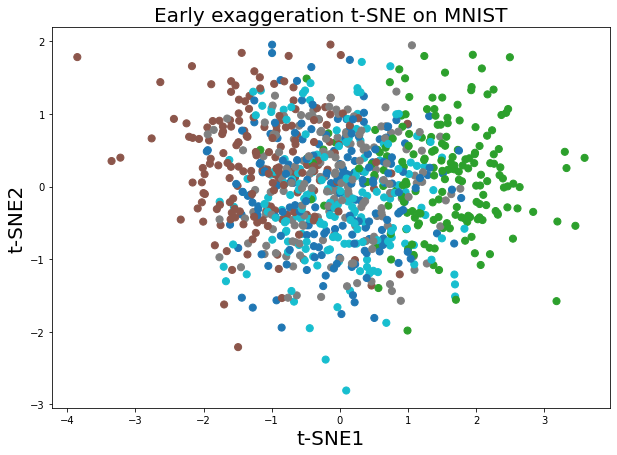

At step 260, KL divergence =2.0783081758430417


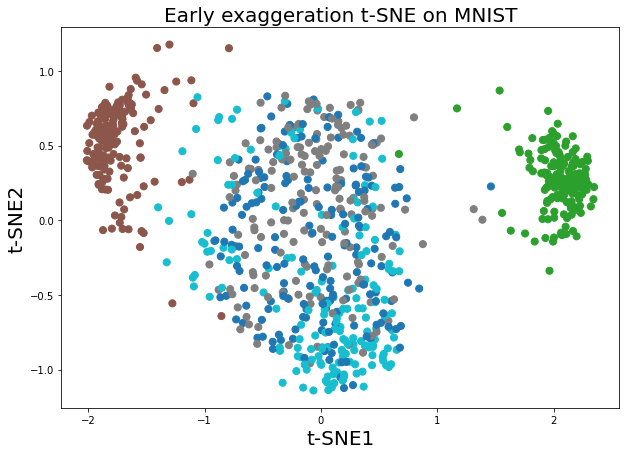

At step 270, KL divergence =1.6610326091006533


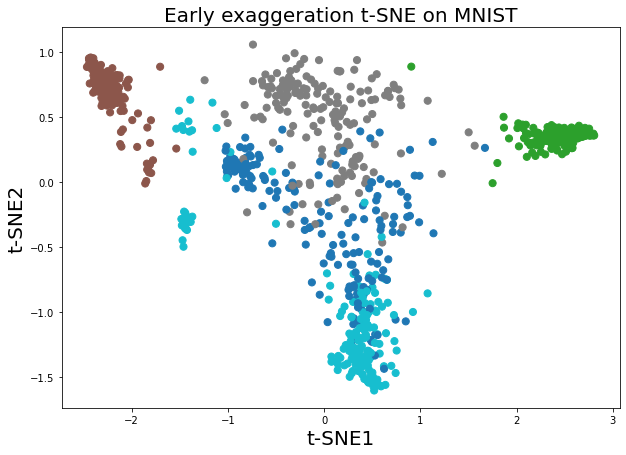

At step 280, KL divergence =1.4516709416906335


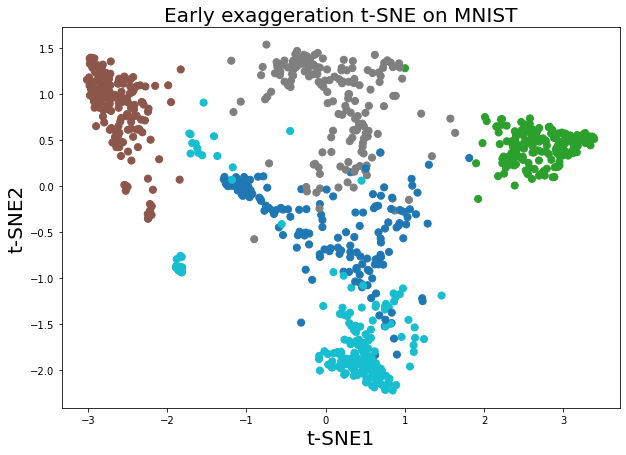

At step 290, KL divergence =1.315223960218346


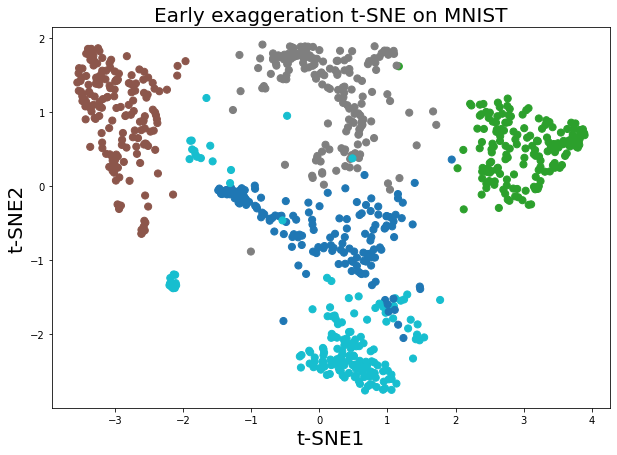

At step 300, KL divergence =1.22144245582294


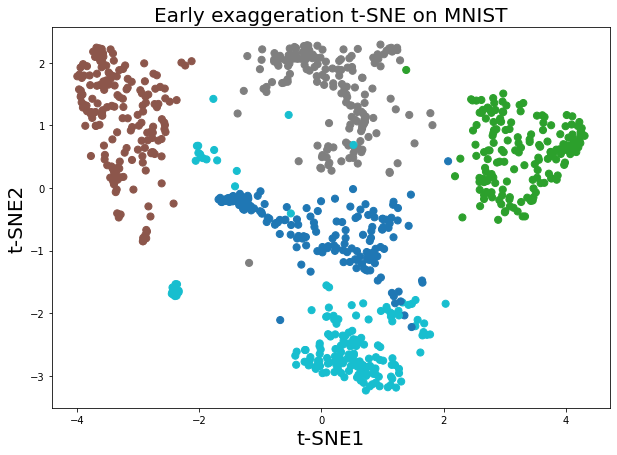

At step 310, KL divergence =1.1532545193910722


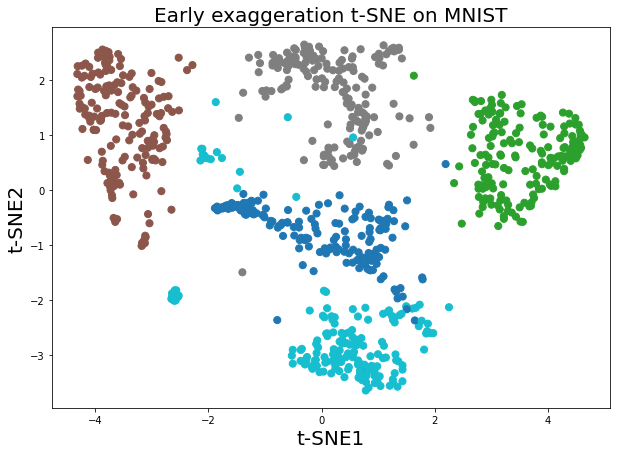

At step 320, KL divergence =1.100203734571984


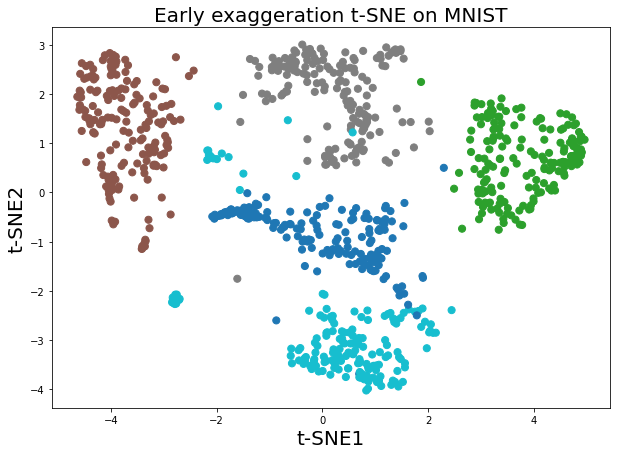

At step 330, KL divergence =1.0572831714003406


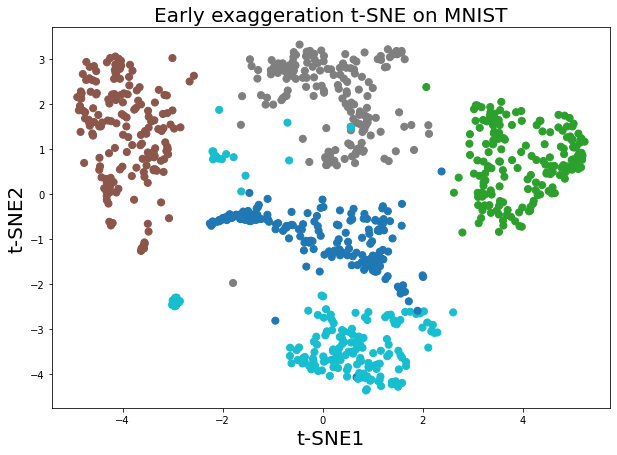

At step 340, KL divergence =1.0216880165797546


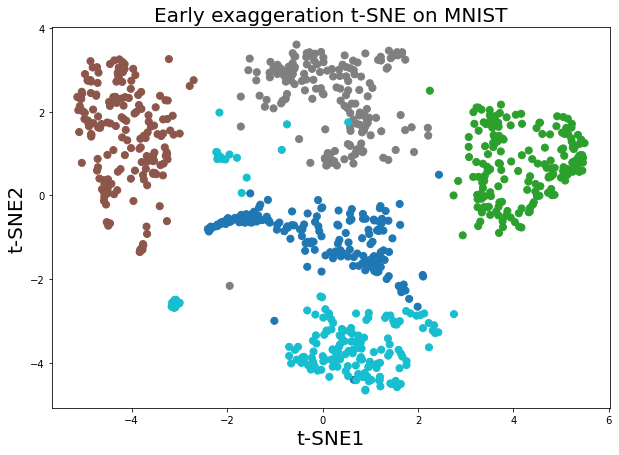

At step 350, KL divergence =0.9915841837588286


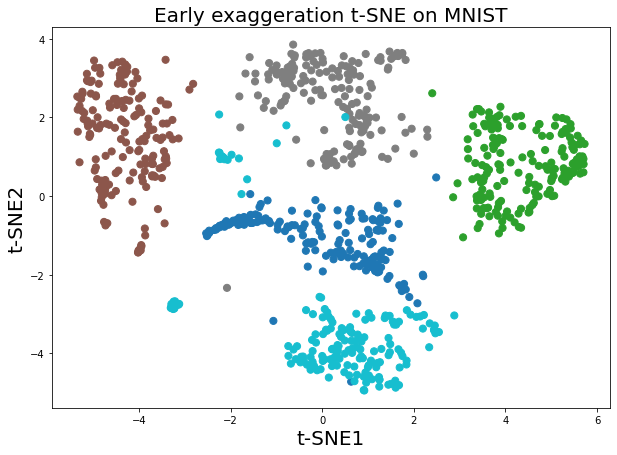

At step 360, KL divergence =0.9656780814819516


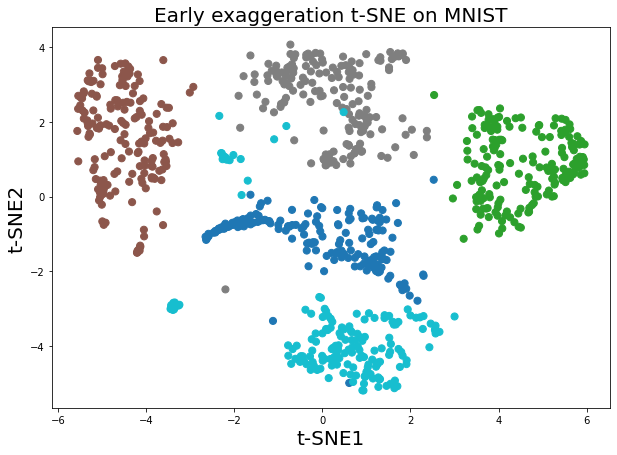

At step 370, KL divergence =0.9430482346201459


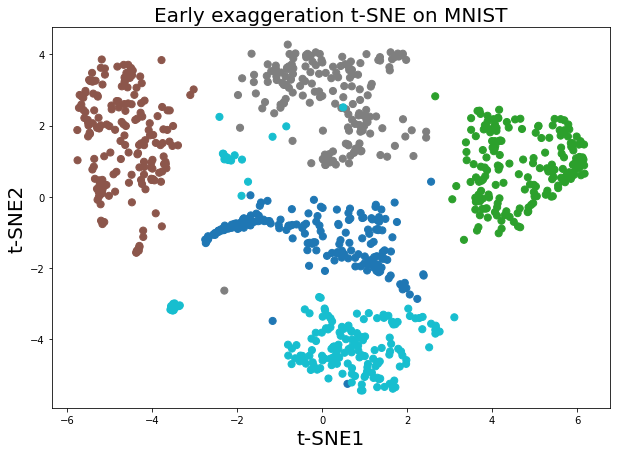

At step 380, KL divergence =0.9230250829895595


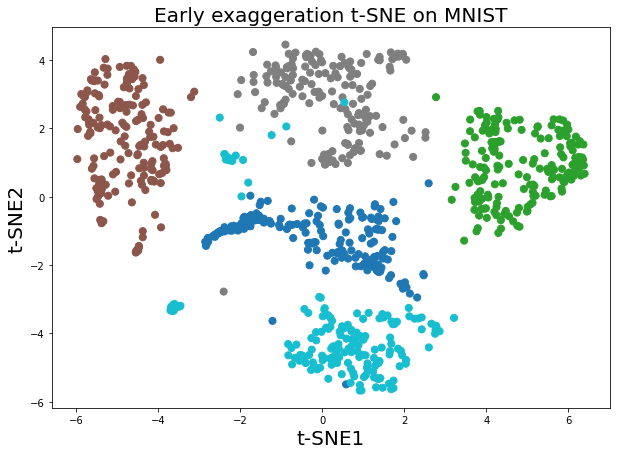

At step 390, KL divergence =0.9051172345091439


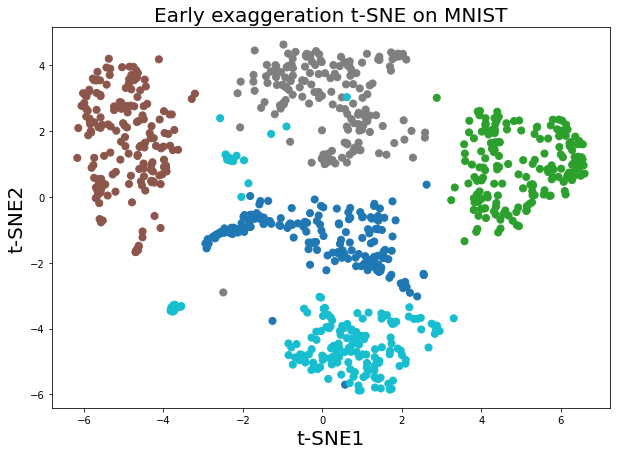

In [ ]:
# T-sne early exaggeration
N_LOW_DIMS = 2
LEARNING_RATE = 100
MAX_ITER = 400
np.random.seed(42)
# initialize the coordinates Z of the low-dimensional embedding 
#using Normal distribution and update Z via the Gradient Descent rule
Z = np.random.normal(loc = 0, scale = 1, size = (n, N_LOW_DIMS))
KL_array = []
file_names =[]
print("Running Gradient Descent: \n")

alpha_one = 12 * P

for i in range(MAX_ITER):
  

  if i <250:
    Q, inv_distances = calc_q_tsne(Z)
    Z_grad  = tsne_grad(alpha_one, Q, Z, inv_distances)
    Z = Z - LEARNING_RATE * Z_grad


    KL_curr = KL(alpha_one, Q)
    KL_array.append(KL_curr)
    if i % 10 == 0:
      print('At step '+ str(i) + ', KL divergence ='+ str(KL_curr))
      # plot every 10 iterations
      plt.figure(figsize=(10,7))
      plt.scatter(Z[:,0], Z[:,1], c=y, cmap = 'tab10', s = 50)
      plt.xlabel("t-SNE1", fontsize = 20); plt.ylabel("t-SNE2", fontsize = 20)
      plt.title("t-SNE on MNIST", fontsize = 20)
      plt.show()

  else:
    Q, inv_distances = calc_q_tsne(Z)
    Z_grad  = tsne_grad(P, Q, Z, inv_distances)
    Z = Z - LEARNING_RATE * Z_grad


    KL_curr = KL(P, Q)
    KL_array.append(KL_curr)
    if i % 10 == 0:
      print('At step '+ str(i) + ', KL divergence ='+ str(KL_curr))
      # plot every 10 iterations
      plt.figure(figsize=(10,7))
      plt.scatter(Z[:,0], Z[:,1], c=y, cmap = 'tab10', s = 50)
      plt.xlabel("t-SNE1", fontsize = 20); plt.ylabel("t-SNE2", fontsize = 20)
      plt.title("Early exaggeration t-SNE on MNIST", fontsize = 20)
      plt.show()



Running Gradient Descent: 

At step 0, KL divergence =657.1262887116029


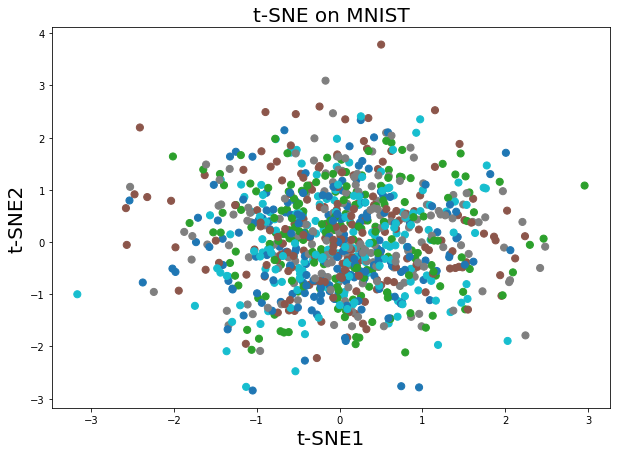

At step 10, KL divergence =634.606470945177


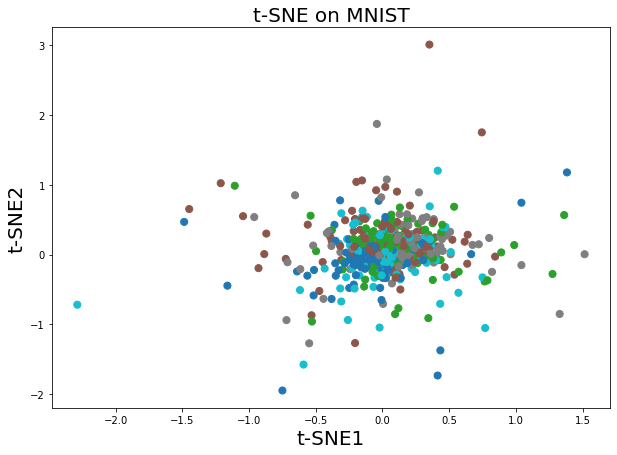

At step 20, KL divergence =633.966760936224


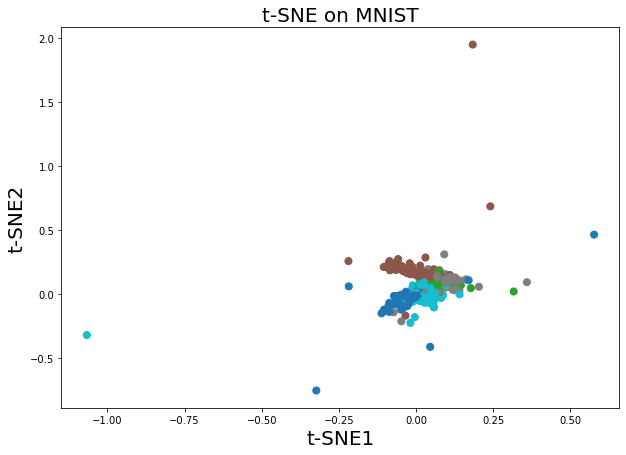

At step 30, KL divergence =634.5471399309469


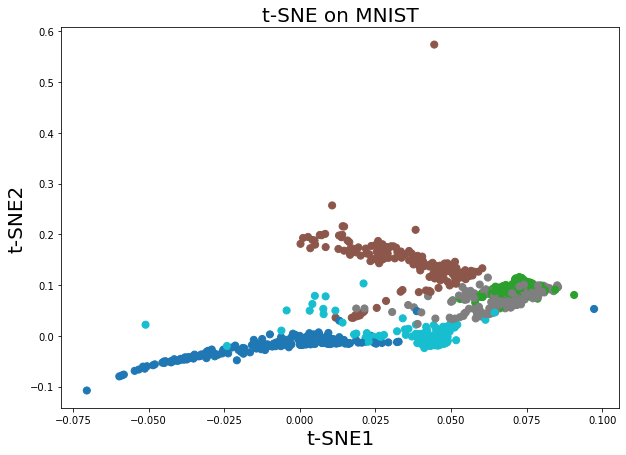

At step 40, KL divergence =634.882206778963


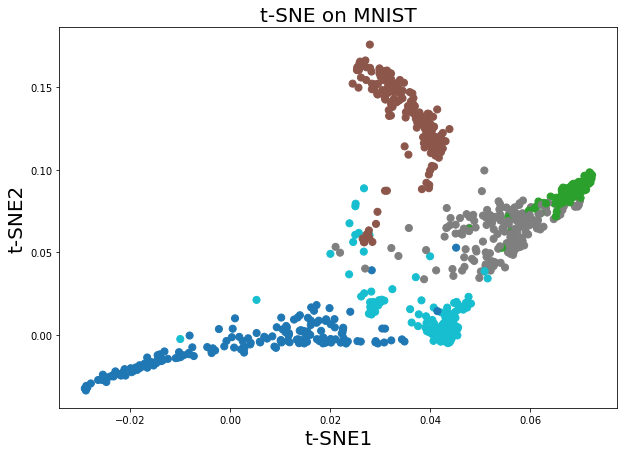

At step 50, KL divergence =635.0722324296333


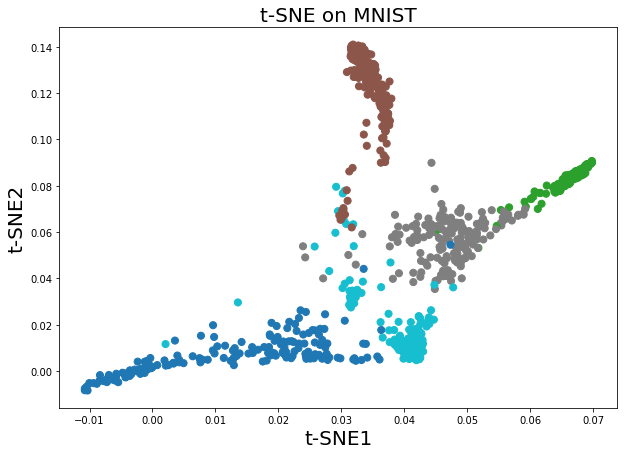

At step 60, KL divergence =635.1905439213698


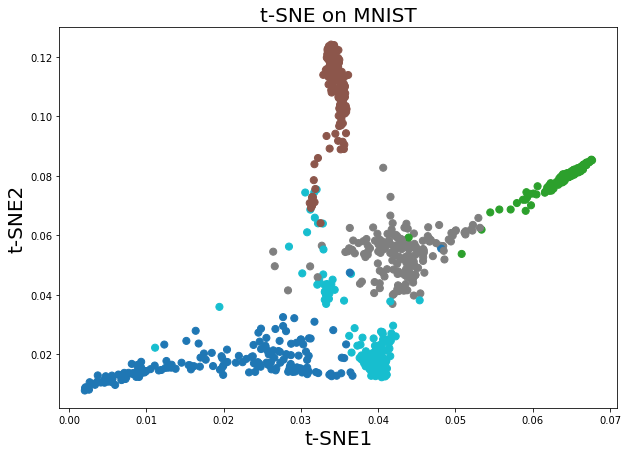

At step 70, KL divergence =635.2683721074376


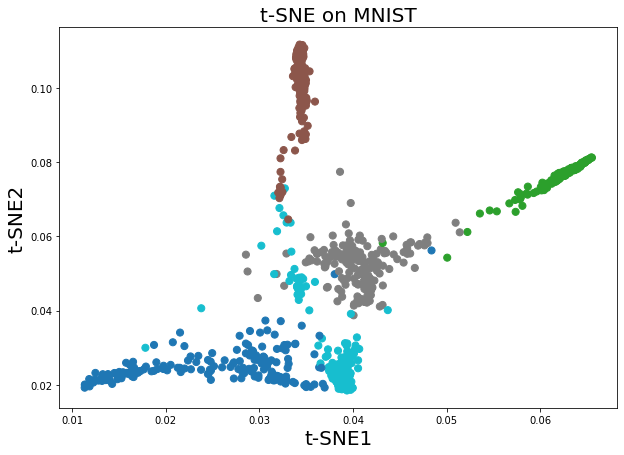

At step 80, KL divergence =635.3213447744172


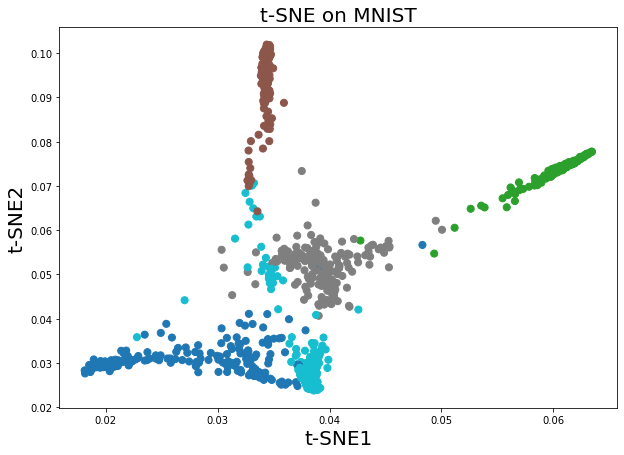

At step 90, KL divergence =635.3582010576855


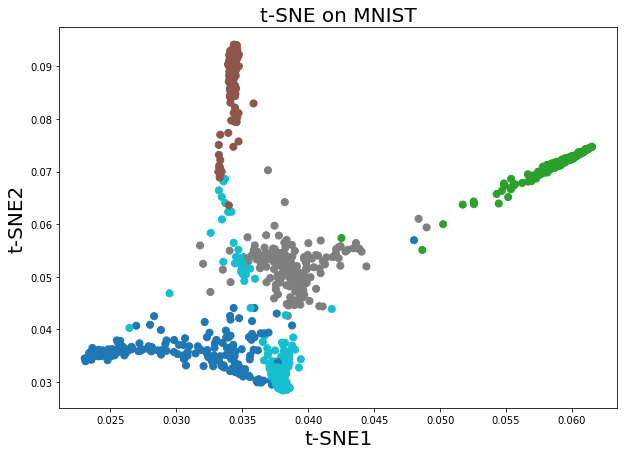

At step 100, KL divergence =635.3842260745254


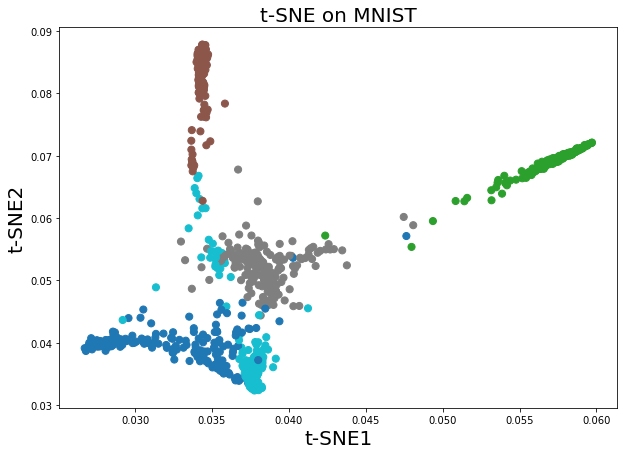

At step 110, KL divergence =635.4027986889681


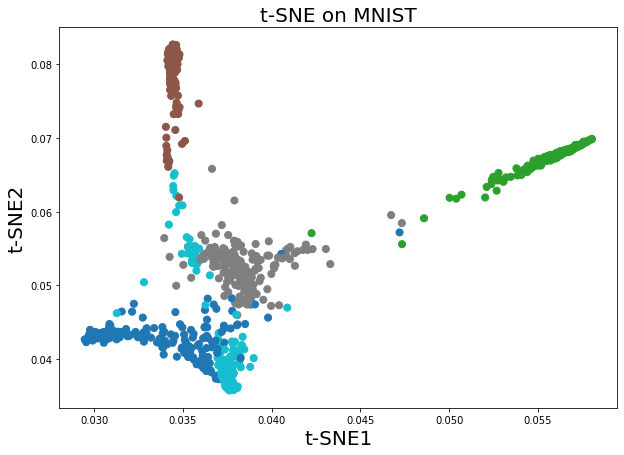

At step 120, KL divergence =635.4161622840485


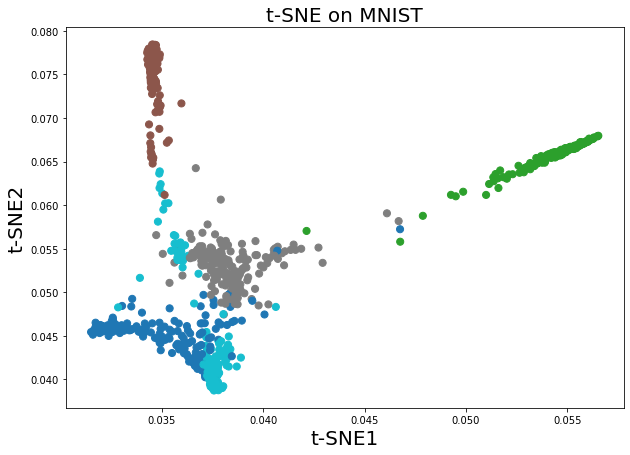

At step 130, KL divergence =635.4258444574492


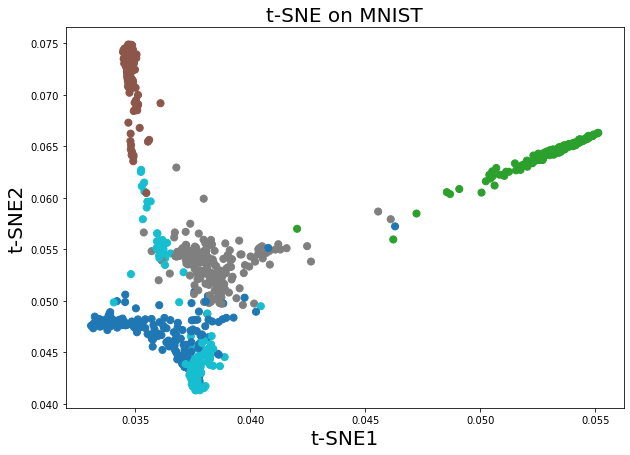

At step 140, KL divergence =635.4329032848113


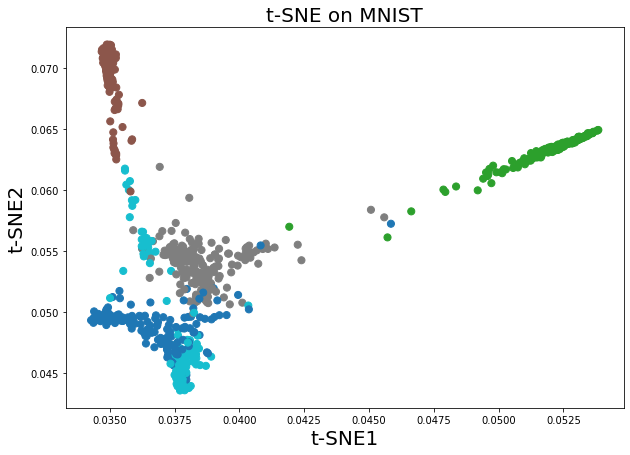

At step 150, KL divergence =635.4380803696298


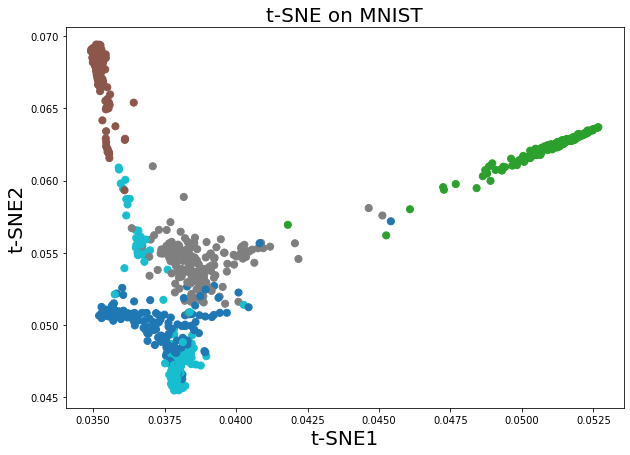

At step 160, KL divergence =635.4419000017677


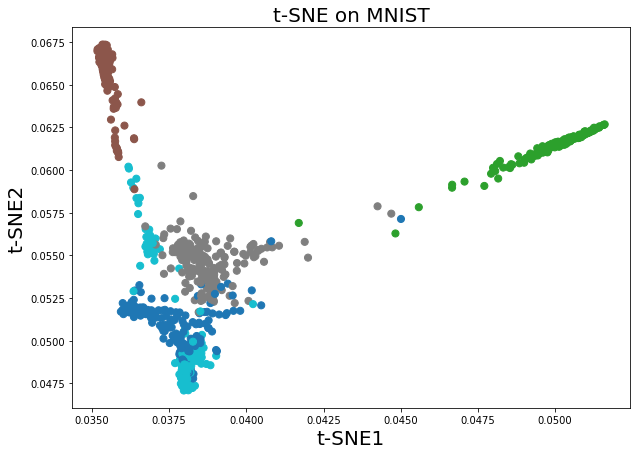

At step 170, KL divergence =635.4447353012296


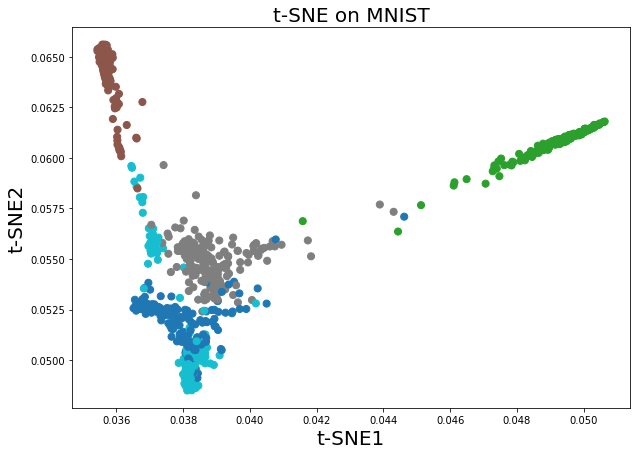

At step 180, KL divergence =635.4468532446855


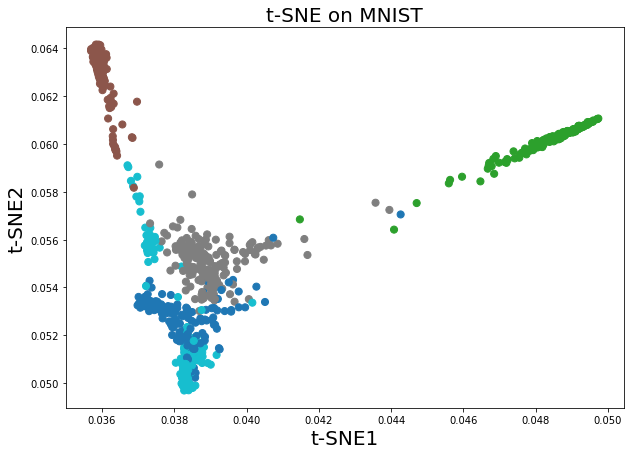

At step 190, KL divergence =635.4484457584919


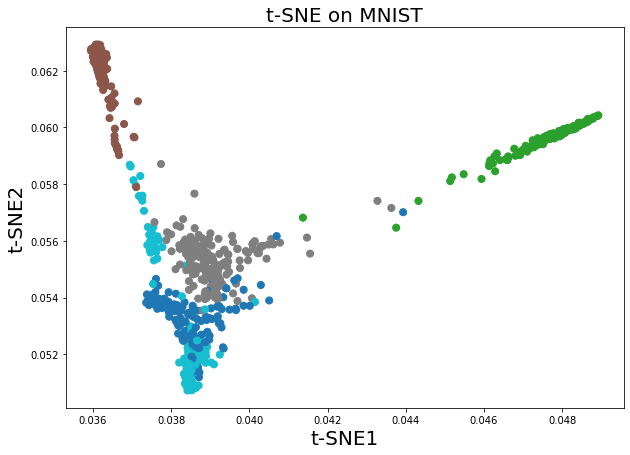

At step 200, KL divergence =635.4496514123607


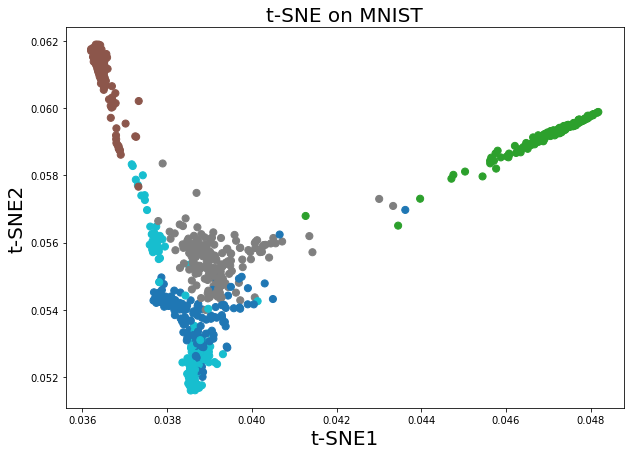

At step 210, KL divergence =635.4505706710024


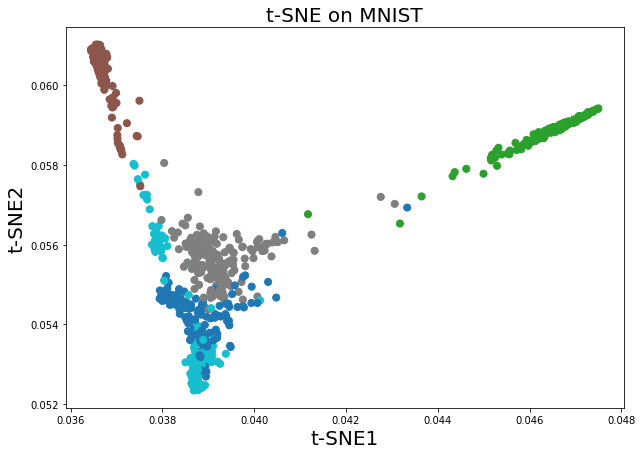

At step 220, KL divergence =635.4512766794303


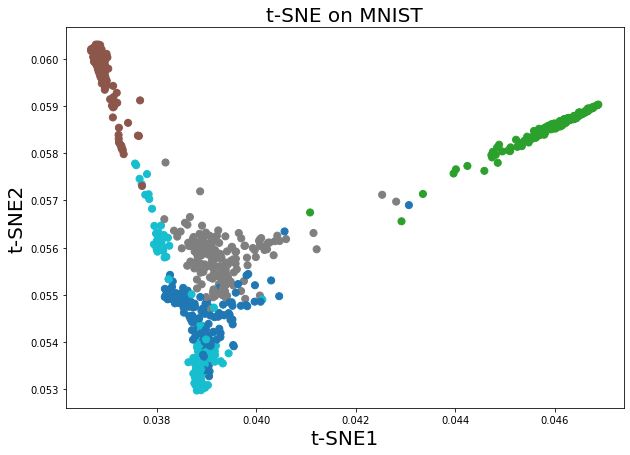

At step 230, KL divergence =635.4518229251693


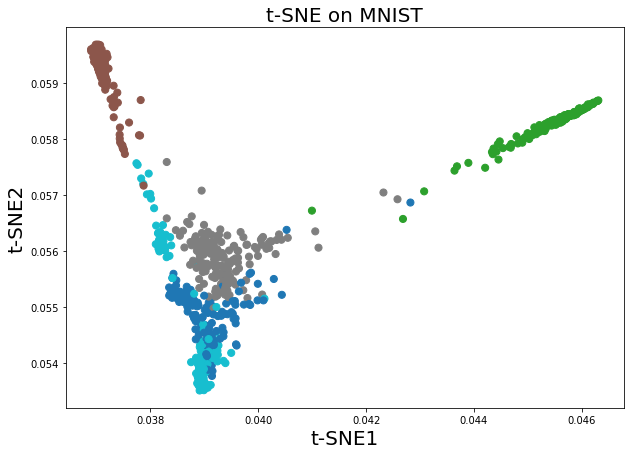

At step 240, KL divergence =635.4522487025123


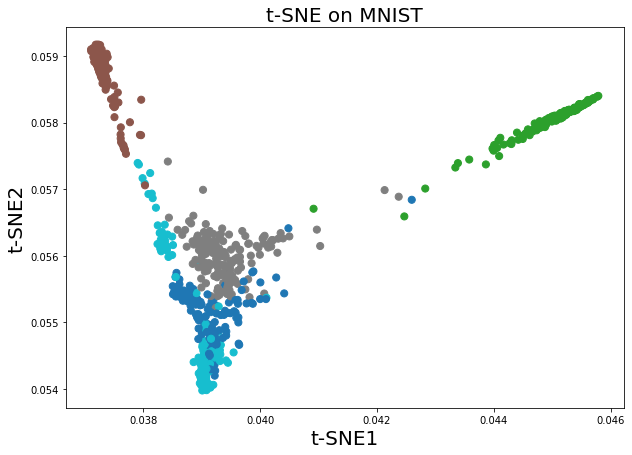

At step 250, KL divergence =2.5967494012488497


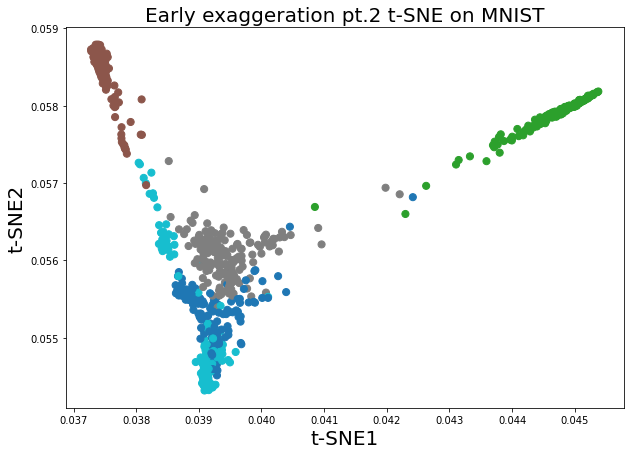

At step 260, KL divergence =2.596747978583758


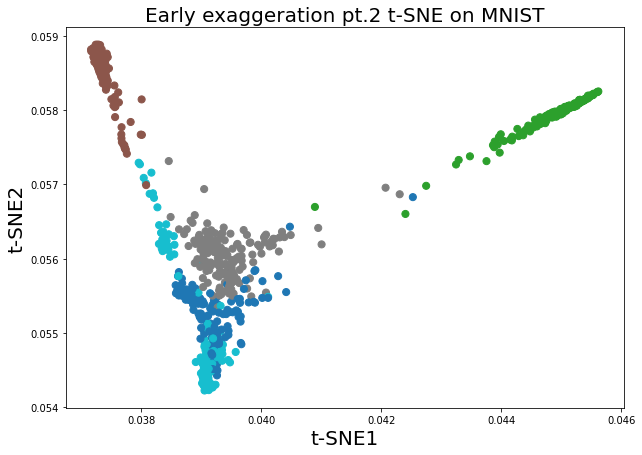

At step 270, KL divergence =2.596746428337076


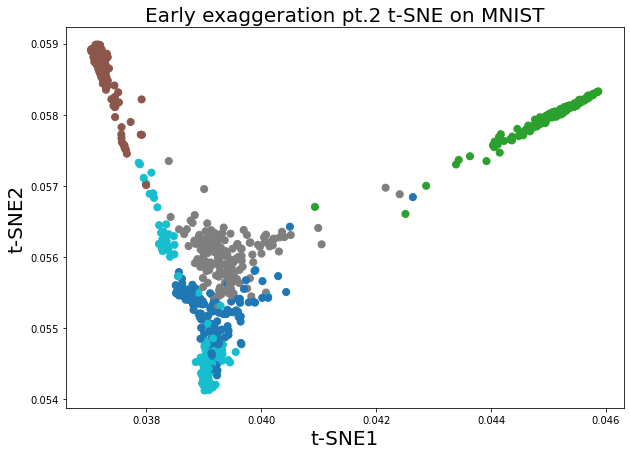

At step 280, KL divergence =2.5967447390689773


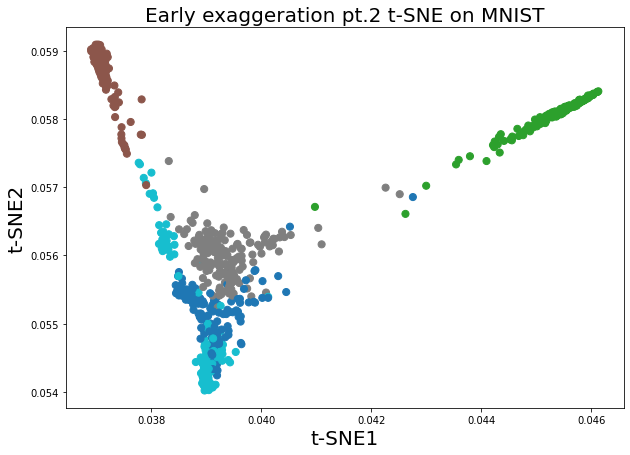

At step 290, KL divergence =2.5967428983142407


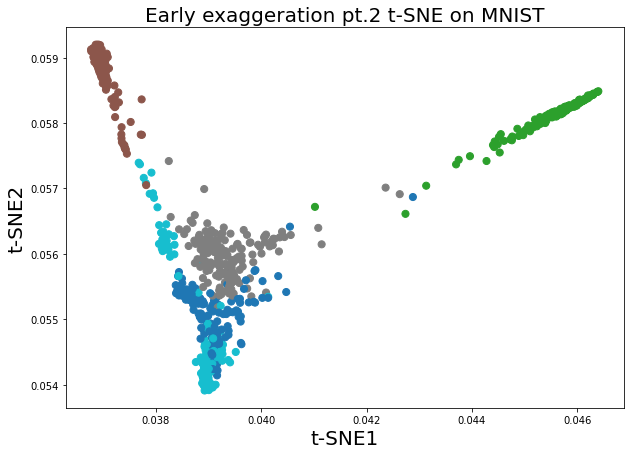

At step 300, KL divergence =2.59674089249042


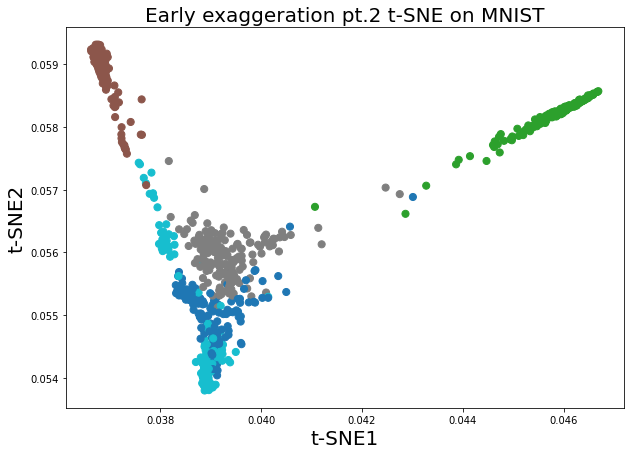

At step 310, KL divergence =2.596738706797802


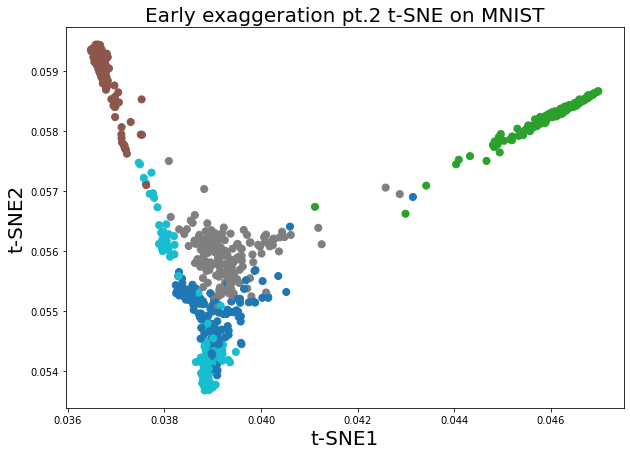

At step 320, KL divergence =2.5967363251104354


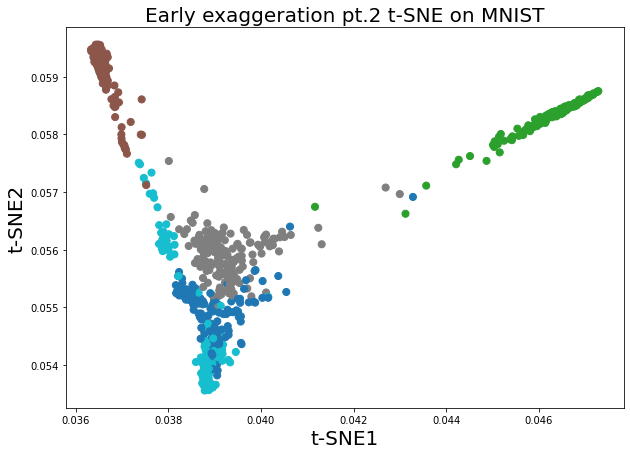

At step 330, KL divergence =2.59673372985742


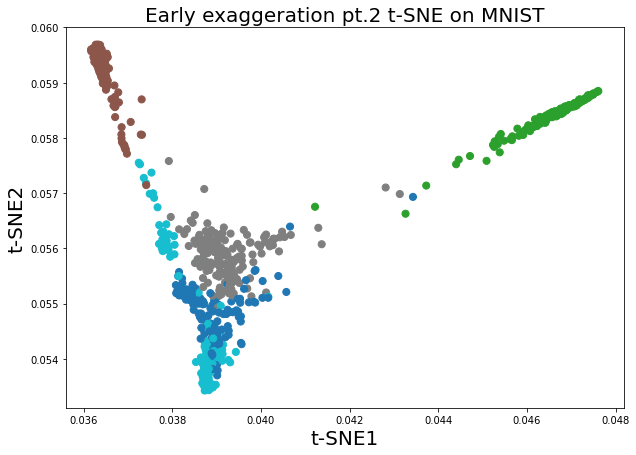

At step 340, KL divergence =2.596730901893589


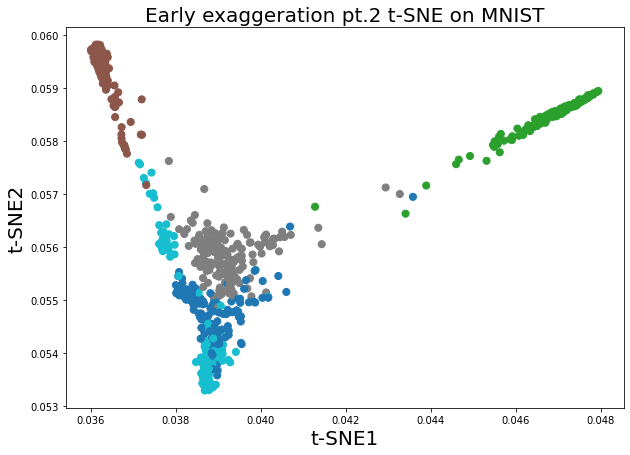

At step 350, KL divergence =2.596727820358673


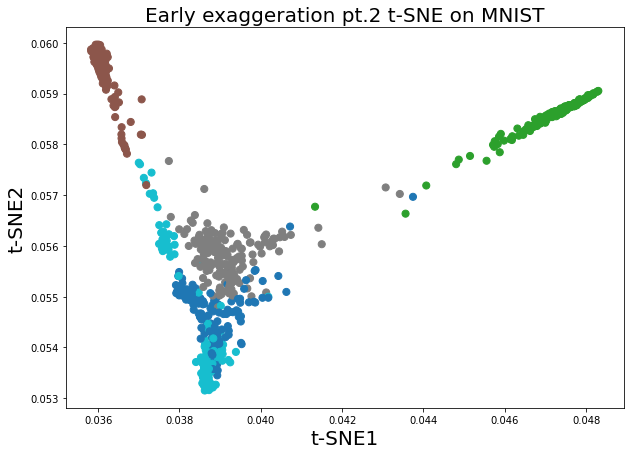

At step 360, KL divergence =2.5967244625238783


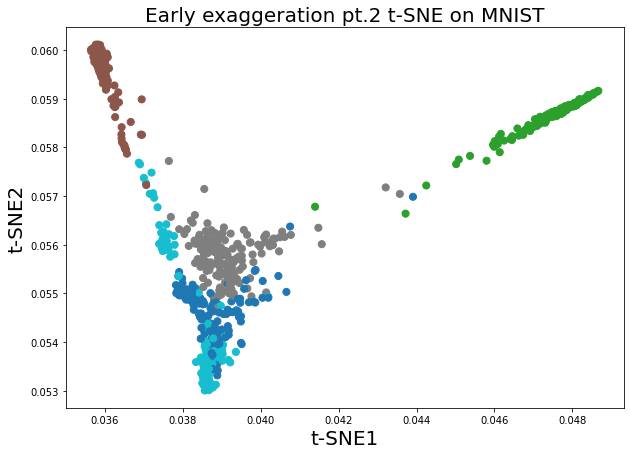

At step 370, KL divergence =2.5967208036248017


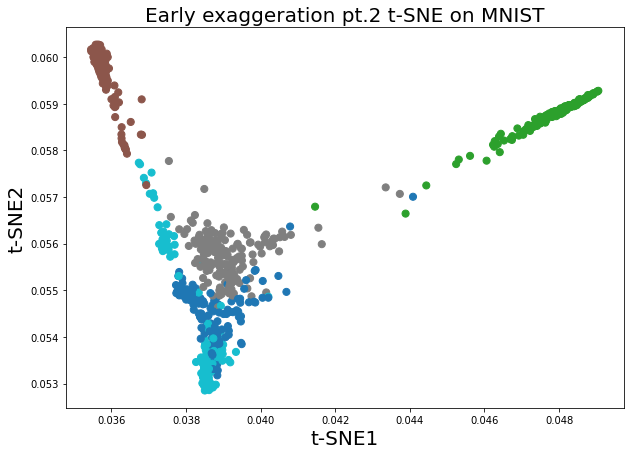

At step 380, KL divergence =2.5967168166794607


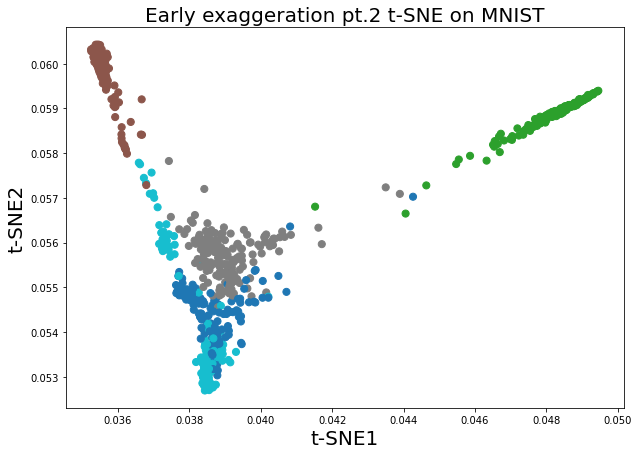

At step 390, KL divergence =2.5967124722901014


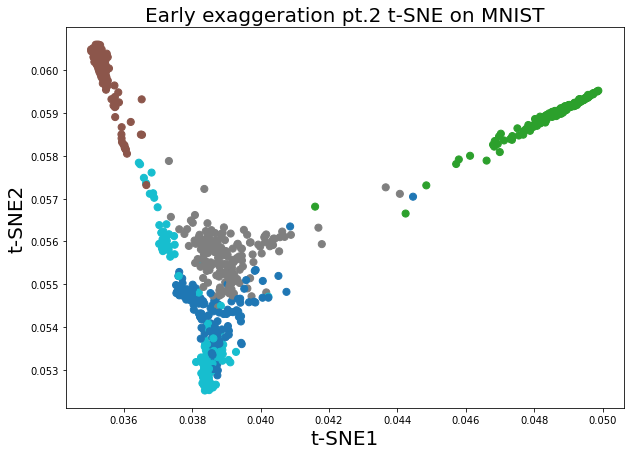

In [ ]:
# T-sne early exaggeration part 2
N_LOW_DIMS = 2
LEARNING_RATE = 1
MAX_ITER = 400
np.random.seed(42)
# initialize the coordinates Z of the low-dimensional embedding 
#using Normal distribution and update Z via the Gradient Descent rule
Z = np.random.normal(loc = 0, scale = 1, size = (n, N_LOW_DIMS))
KL_array = []
file_names =[]
print("Running Gradient Descent: \n")

alpha_two = n/10 * P

for i in range(MAX_ITER):
  
  if i <250:
    Q, inv_distances = calc_q_tsne(Z)
    Z_grad  = tsne_grad(alpha_two, Q, Z, inv_distances)
    Z = Z - LEARNING_RATE * Z_grad


    KL_curr = KL(alpha_two, Q)
    KL_array.append(KL_curr)
    if i % 10 == 0:
      print('At step '+ str(i) + ', KL divergence ='+ str(KL_curr))
      # plot every 10 iterations
      plt.figure(figsize=(10,7))
      plt.scatter(Z[:,0], Z[:,1], c=y, cmap = 'tab10', s = 50)
      plt.xlabel("t-SNE1", fontsize = 20); plt.ylabel("t-SNE2", fontsize = 20)
      plt.title("t-SNE on MNIST", fontsize = 20)
      plt.show()
    if i == 100:
      newZ = Z
  

  else:
    Q, inv_distances = calc_q_tsne(Z)
    Z_grad  = tsne_grad(P, Q, Z, inv_distances)
    Z = Z - LEARNING_RATE * Z_grad


    KL_curr = KL(P, Q)
    KL_array.append(KL_curr)
    if i % 10 == 0:
      print('At step '+ str(i) + ', KL divergence ='+ str(KL_curr))
      # plot every 10 iterations
      plt.figure(figsize=(10,7))
      plt.scatter(Z[:,0], Z[:,1], c=y, cmap = 'tab10', s = 50)
      plt.xlabel("t-SNE1", fontsize = 20); plt.ylabel("t-SNE2", fontsize = 20)
      plt.title("Early exaggeration pt.2 t-SNE on MNIST", fontsize = 20)
      plt.show()



In [ ]:
p = P.copy()
new_diag = 1-p.sum(axis = 1)
np.fill_diagonal(p,new_diag)
p

array([[9.99173227e-01, 7.09173597e-11, 4.46383271e-11, ...,
        1.87250851e-08, 3.29724439e-06, 5.88487101e-07],
       [7.09173597e-11, 9.98613070e-01, 6.78260951e-11, ...,
        2.31701252e-06, 3.35354205e-09, 2.80344562e-07],
       [4.46383271e-11, 6.78260951e-11, 9.99183034e-01, ...,
        1.51261816e-09, 5.36779475e-10, 6.51446430e-10],
       ...,
       [1.87250851e-08, 2.31701252e-06, 1.51261816e-09, ...,
        9.99068378e-01, 7.63194136e-08, 1.74200716e-05],
       [3.29724439e-06, 3.35354205e-09, 5.36779475e-10, ...,
        7.63194136e-08, 9.98998175e-01, 5.20902969e-07],
       [5.88487101e-07, 2.80344562e-07, 6.51446430e-10, ...,
        1.74200716e-05, 5.20902969e-07, 9.99101383e-01]])

At step 0, KL divergence =2.5960104673348514


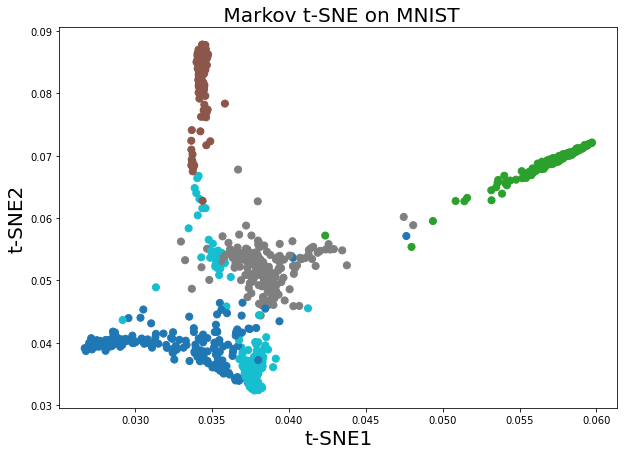

At step 10, KL divergence =2.5960113074205764


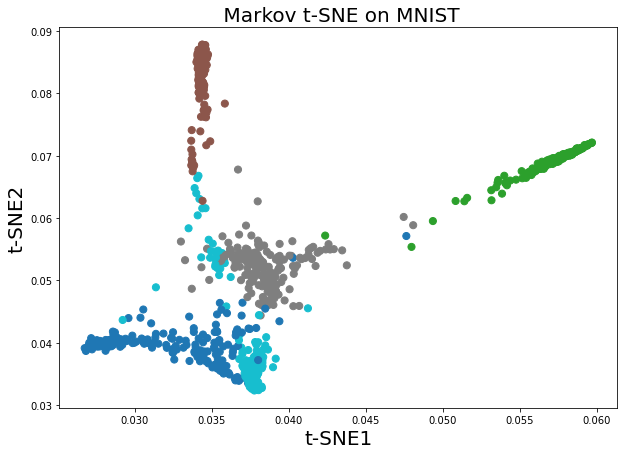

At step 20, KL divergence =2.596012146529737


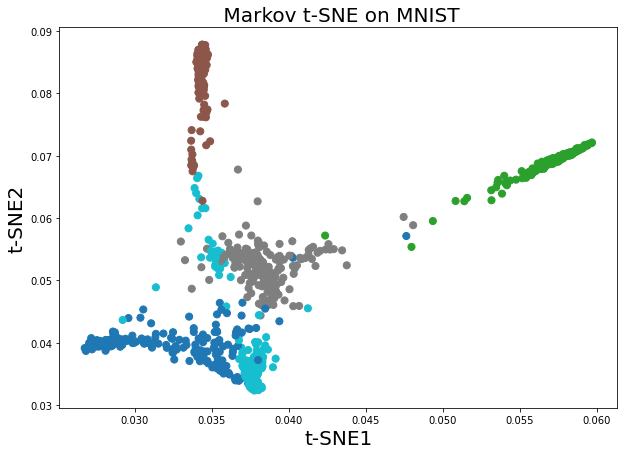

At step 30, KL divergence =2.596012984663524


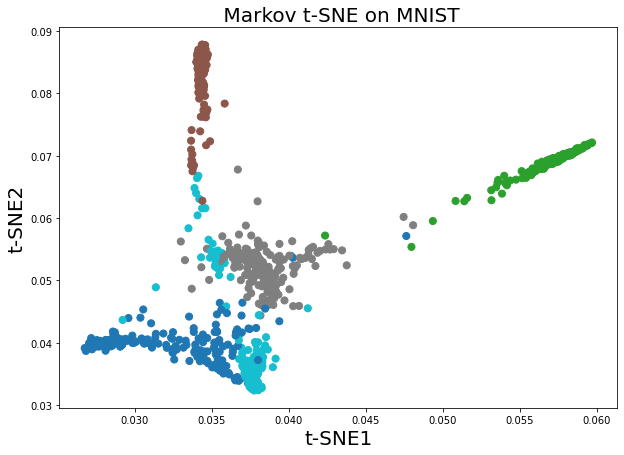

At step 40, KL divergence =2.5960138218231177


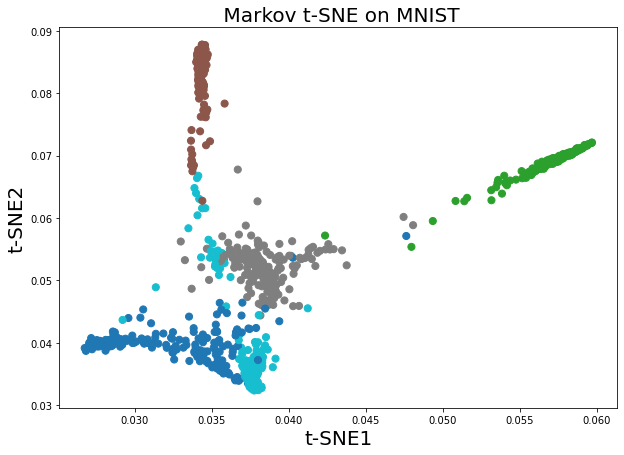

At step 50, KL divergence =2.596014658009711


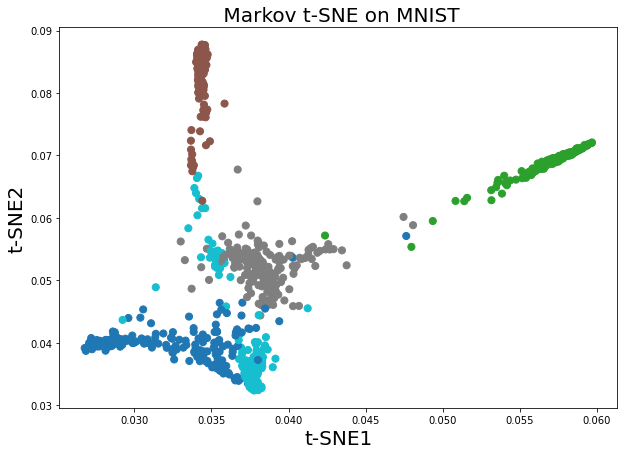

At step 60, KL divergence =2.5960154932244794


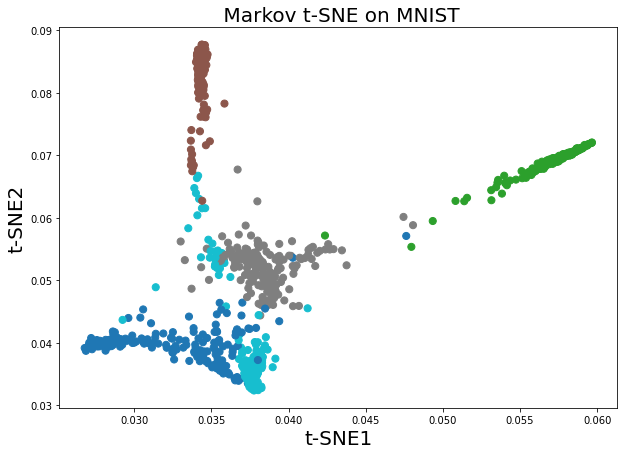

At step 70, KL divergence =2.5960163274686074


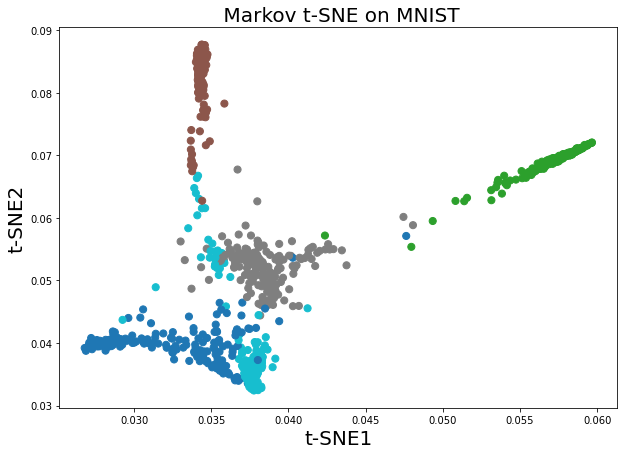

At step 80, KL divergence =2.596017160743275


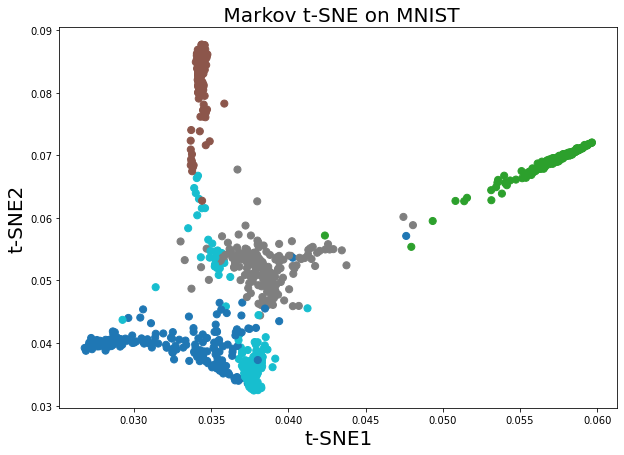

At step 90, KL divergence =2.59601799304966


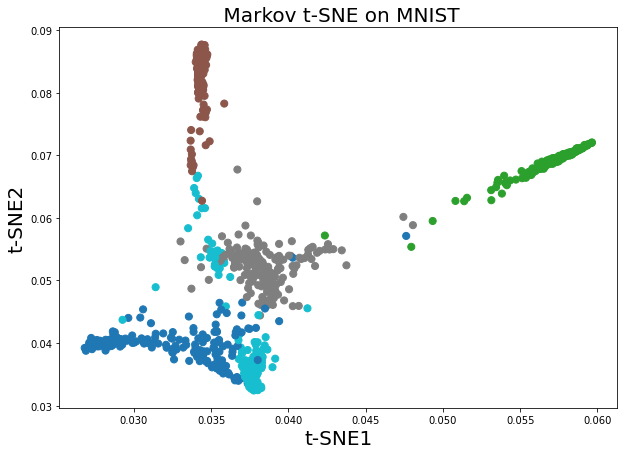

At step 100, KL divergence =2.5960188243889397


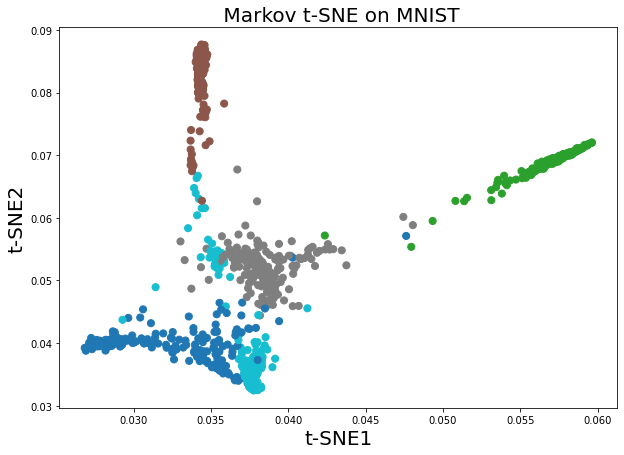

At step 110, KL divergence =2.5960196547622885


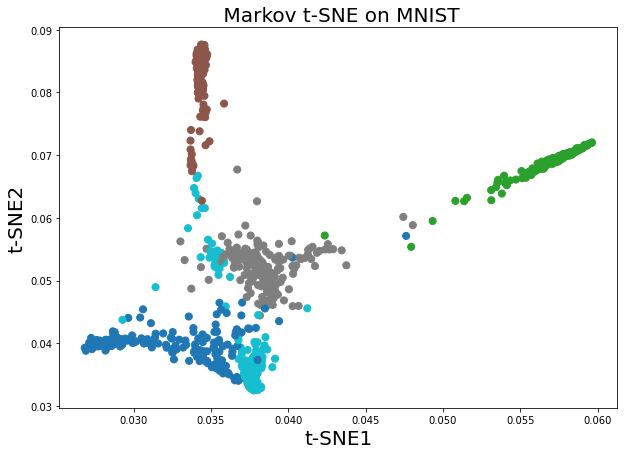

At step 120, KL divergence =2.5960204841708827


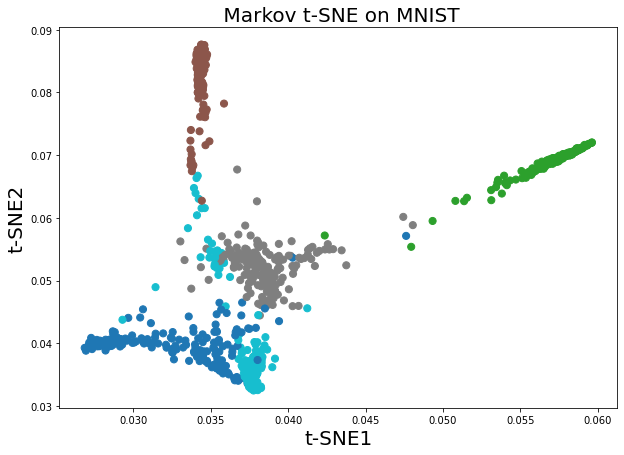

At step 130, KL divergence =2.596021312615893


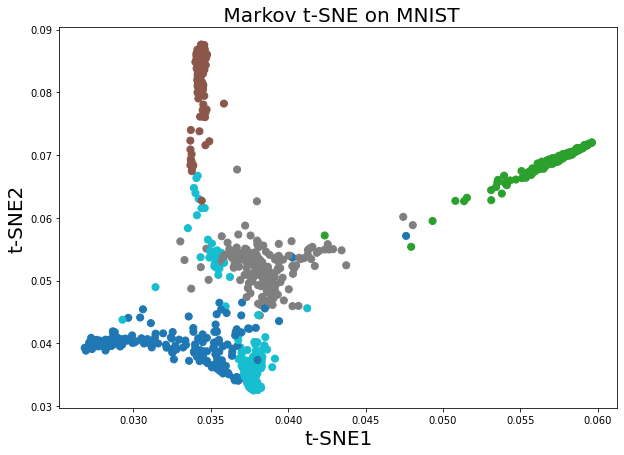

At step 140, KL divergence =2.5960221400984906


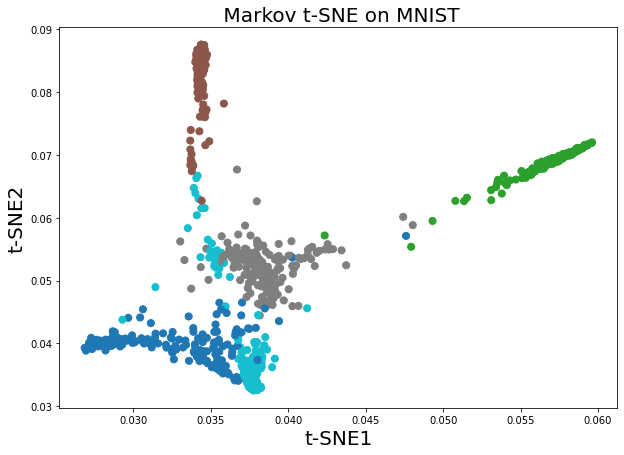

At step 150, KL divergence =2.596022966619845


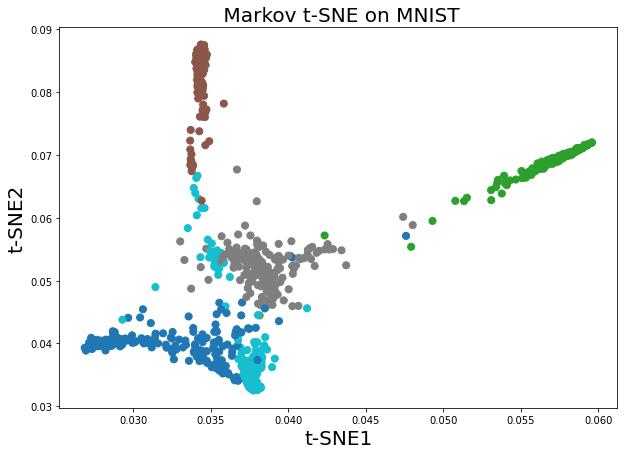

At step 160, KL divergence =2.5960237921811236


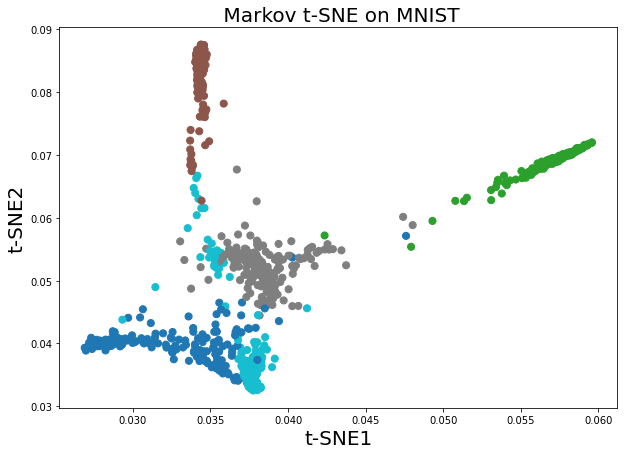

At step 170, KL divergence =2.596024616783493


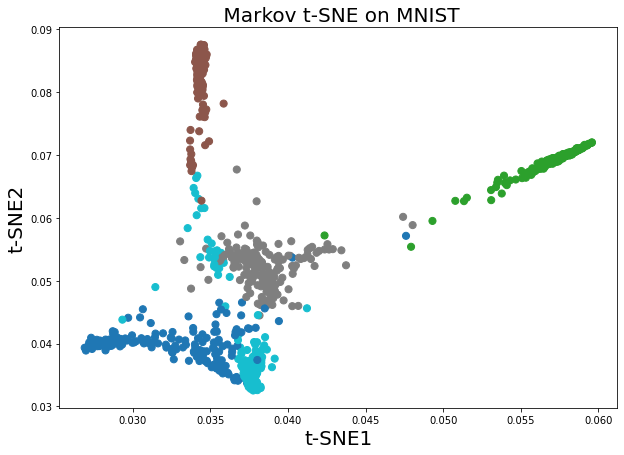

At step 180, KL divergence =2.596025440428119


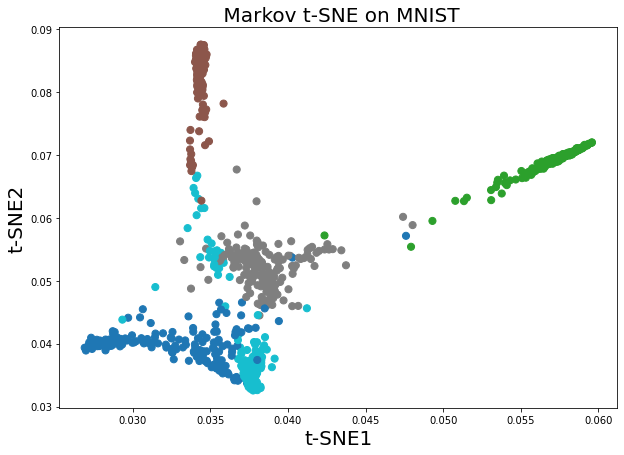

At step 190, KL divergence =2.5960262631161597


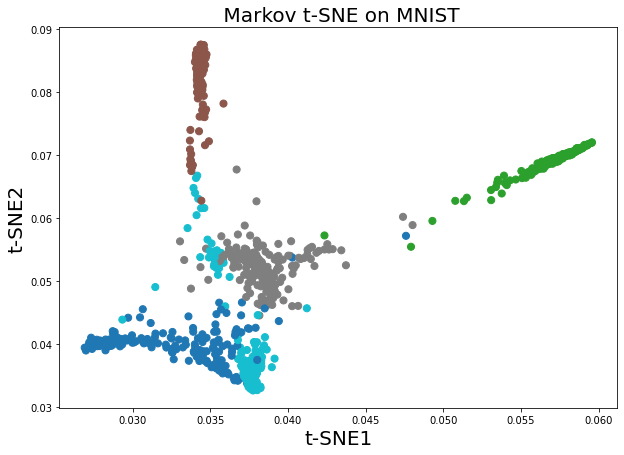

At step 200, KL divergence =2.5960270848487843


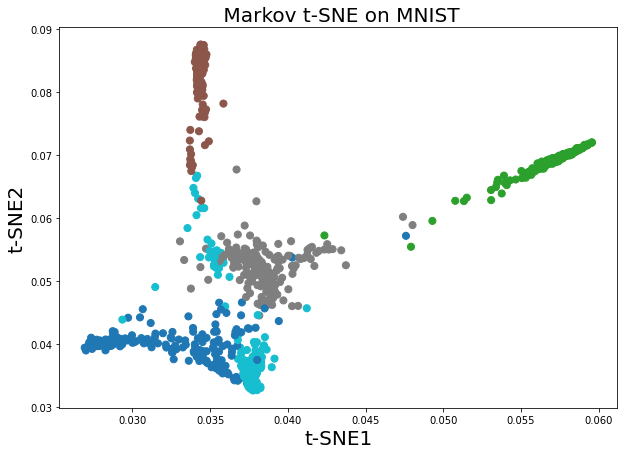

At step 210, KL divergence =2.5960279056271487


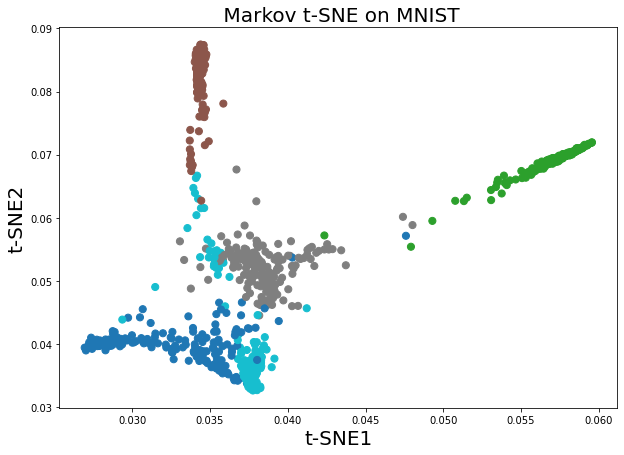

At step 220, KL divergence =2.5960287254524155


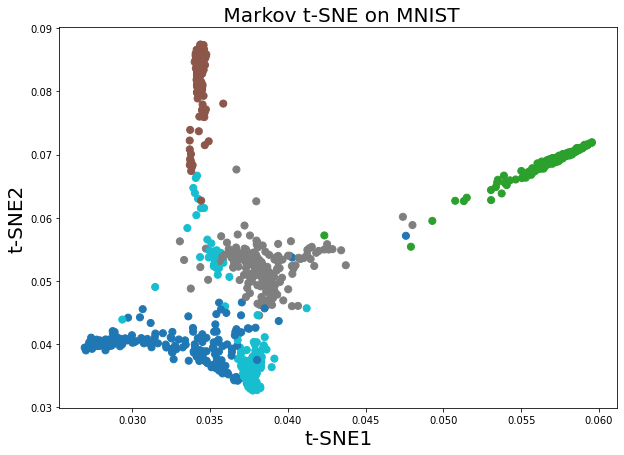

At step 230, KL divergence =2.5960295443257384


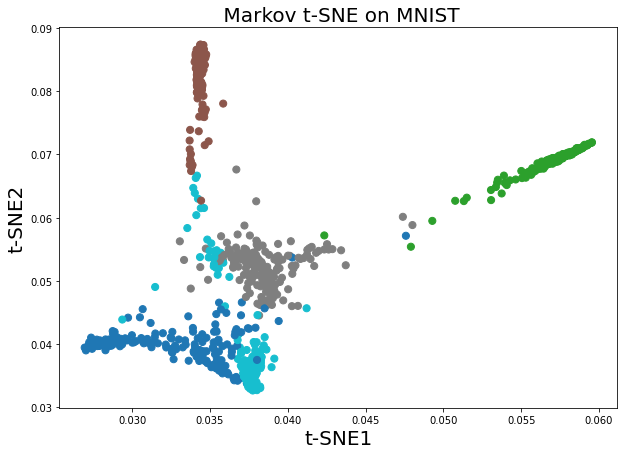

At step 240, KL divergence =2.5960303622482748


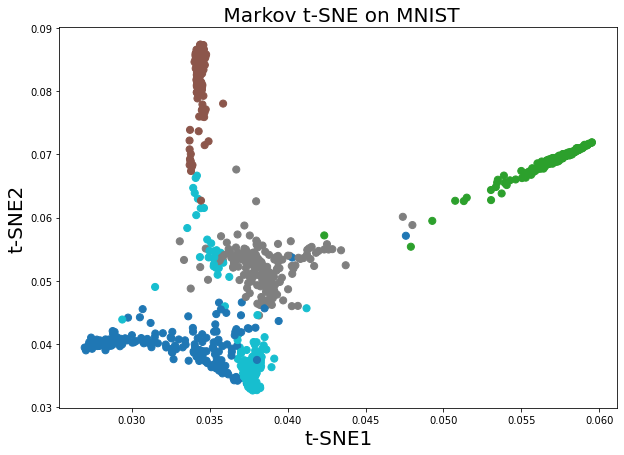

In [ ]:
# Markov implementation
N_LOW_DIMS = 2
LEARNING_RATE = 1
MAX_ITER = 250

KL_array = []
file_names =[]

Z1 = newZ

for i in range(MAX_ITER):

  Q, inv_distances = calc_q_tsne(Z1)
  Z1 = p @ Z1 


  KL_curr = KL(P, Q)
  KL_array.append(KL_curr)
  if i % 10 == 0:
    print('At step '+ str(i) + ', KL divergence ='+ str(KL_curr))
    # plot every 10 iterations
    plt.figure(figsize=(10,7))
    plt.scatter(Z1[:,0], Z1[:,1], c=y, cmap = 'tab10', s = 50)
    plt.xlabel("t-SNE1", fontsize = 20); plt.ylabel("t-SNE2", fontsize = 20)
    plt.title(" Markov t-SNE on MNIST", fontsize = 20)
    plt.show()




In [ ]:
p

array([[9.99173227e-01, 7.09173597e-11, 4.46383271e-11, ...,
        1.87250851e-08, 3.29724439e-06, 5.88487101e-07],
       [7.09173597e-11, 9.98613070e-01, 6.78260951e-11, ...,
        2.31701252e-06, 3.35354205e-09, 2.80344562e-07],
       [4.46383271e-11, 6.78260951e-11, 9.99183034e-01, ...,
        1.51261816e-09, 5.36779475e-10, 6.51446430e-10],
       ...,
       [1.87250851e-08, 2.31701252e-06, 1.51261816e-09, ...,
        9.99068378e-01, 7.63194136e-08, 1.74200716e-05],
       [3.29724439e-06, 3.35354205e-09, 5.36779475e-10, ...,
        7.63194136e-08, 9.98998175e-01, 5.20902969e-07],
       [5.88487101e-07, 2.80344562e-07, 6.51446430e-10, ...,
        1.74200716e-05, 5.20902969e-07, 9.99101383e-01]])

# Your solution: 
TSNE performs better with $α = 12$ than both the markov implementation and the other alpha. The markov implementation looks near identical to the other early exaggeration of $\frac{1}{N}$ as the step size is very very small so there is barely any change between iterations,

# Q3: UMAP (25pt)
Implement UMAP on the previous dataset and embed the data on 2D and 3D. Please plot your result with the various setting for `n_neigh` and `min_dist` parameters. 

- Compare the performance with t-SNE. How much more global structure is preserved with UMAP, particularly with larger values of `n_neigh`. 


- Compare the run-time with t-SNE. How much faster is UMAP algorithm than t-SNE. 




In [ ]:
# Your code starts here
!pip install umap-learn[plot]

import umap
import umap.plot
import plotly.express as px

     |████████████████████████████████| 88 kB 3.8 MB/s 
     |████████████████████████████████| 1.1 MB 9.3 MB/s 
     |████████████████████████████████| 18.2 MB 1.3 MB/s 
     |████████████████████████████████| 76 kB 4.8 MB/s 
     |████████████████████████████████| 837 kB 62.8 MB/s 
     |████████████████████████████████| 136 kB 30.5 MB/s 
     |████████████████████████████████| 830 kB 64.9 MB/s 
     |████████████████████████████████| 822 kB 40.8 MB/s 
     |████████████████████████████████| 802 kB 56.1 MB/s 
     |████████████████████████████████| 802 kB 34.9 MB/s 
     |████████████████████████████████| 793 kB 54.4 MB/s 
     |████████████████████████████████| 793 kB 47.7 MB/s 
     |████████████████████████████████| 791 kB 54.4 MB/s 
     |████████████████████████████████| 786 kB 51.4 MB/s 
     |████████████████████████████████| 779 kB 42.2 MB/s 
     |████████████████████████████████| 778 kB 49.8 MB/s 
     |████████████████████████████████| 776 kB 55.8 MB/s 
     |█████████████

In [ ]:
u_map = umap.UMAP(n_neighbors = 5, min_dist = 0.25).fit(X)
neighbors = [5,10,20]
dist = [0.15,0.25,0.5]


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


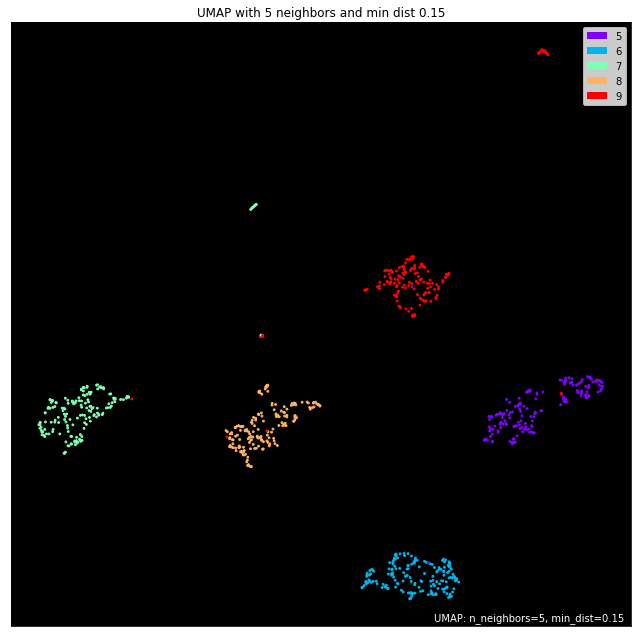

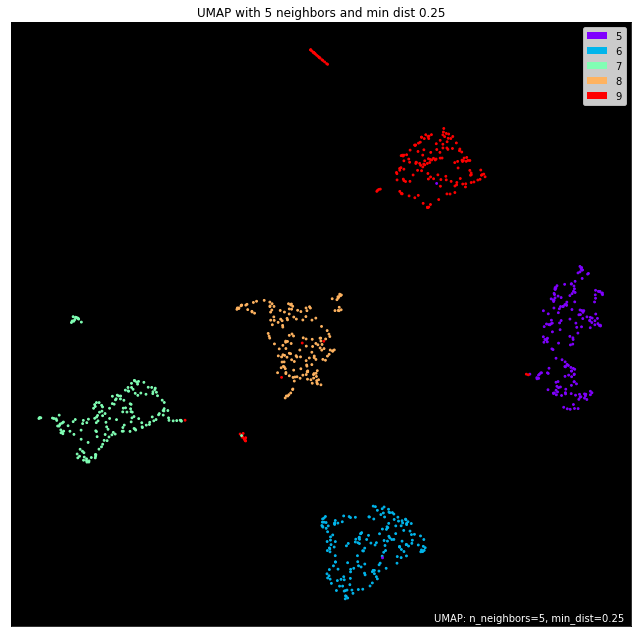

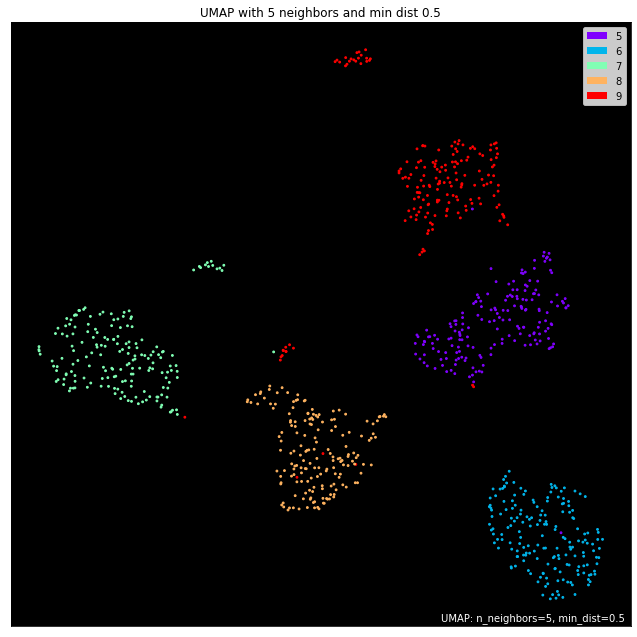

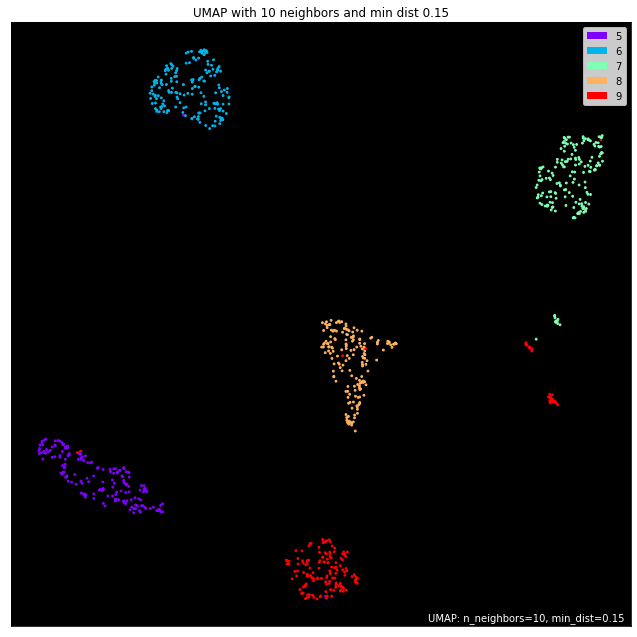

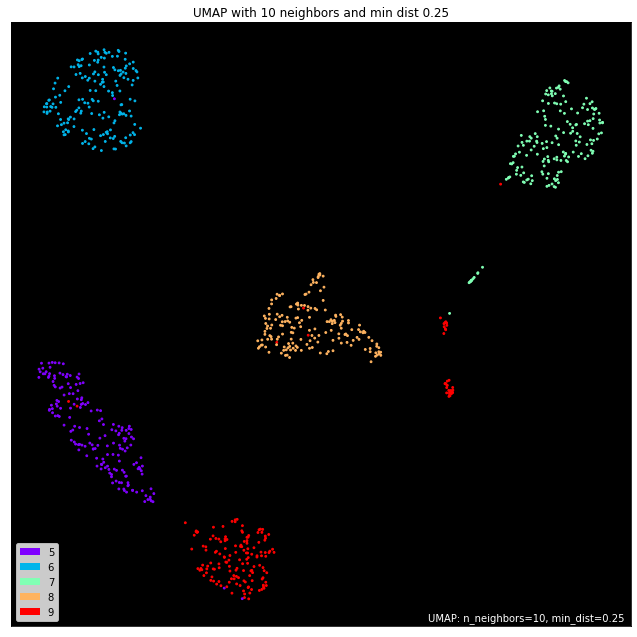

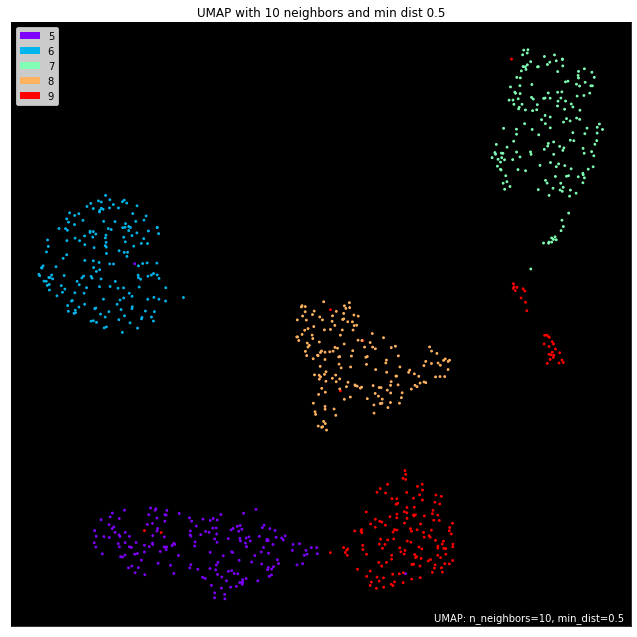

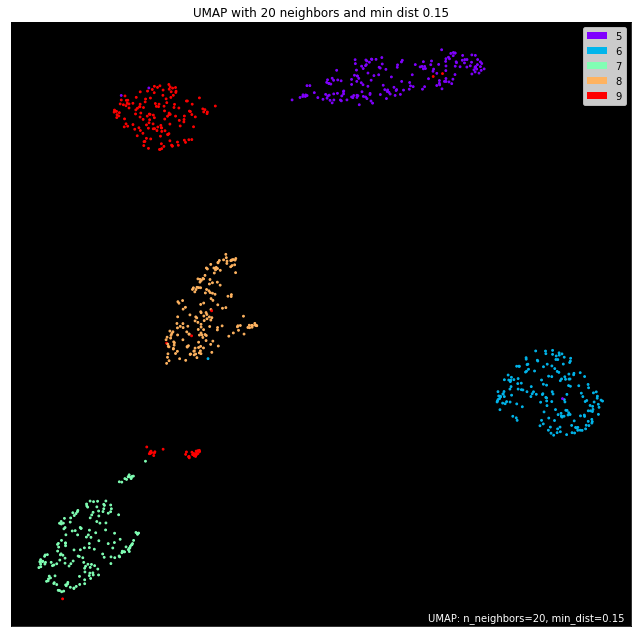

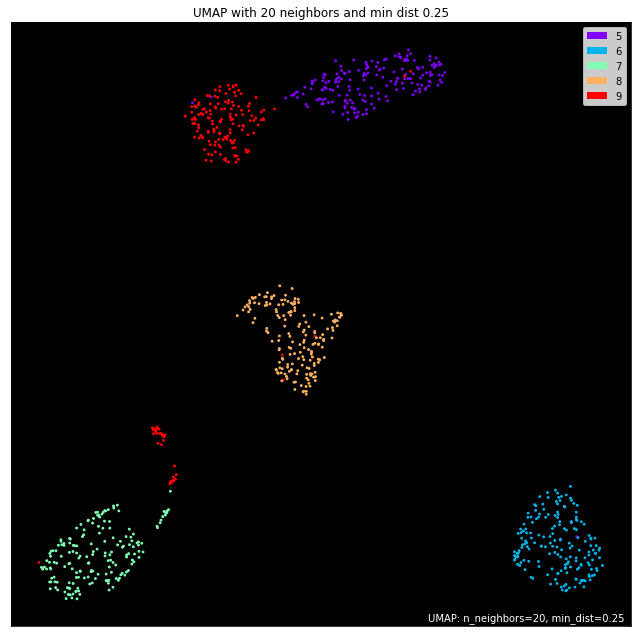

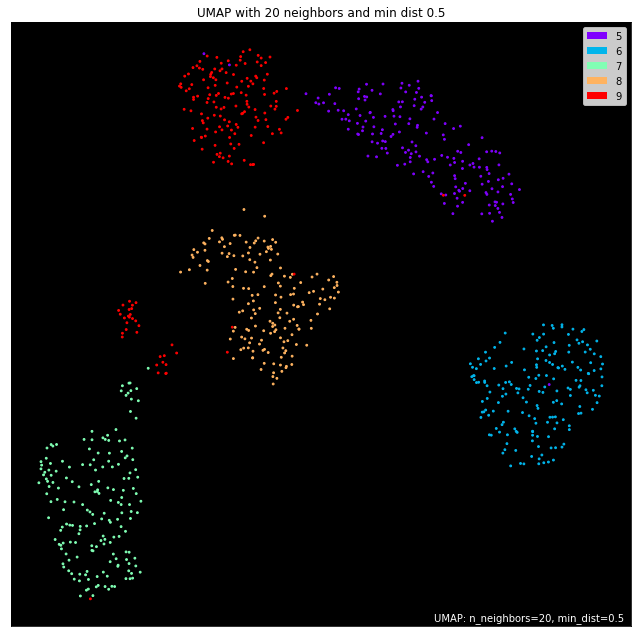

In [ ]:
for i in neighbors:
  for j in dist:
    u_map = umap.UMAP(n_neighbors = i, min_dist = j).fit(X)
    umap.plot.points(u_map, labels = y, theme='fire')
    plt.title(f'UMAP with {i} neighbors and min dist {j}')



In [ ]:
for i in neighbors:
  for j in dist:
    
    u_map_3 = umap.UMAP(n_neighbors = i, min_dist = j, n_components = 3).fit_transform(X)
    fig=px.scatter_3d(x=u_map_3[:,0], y=u_map_3[:,1], z=u_map_3[:,2],color = y,
                    title = f'UMAP on MNIST {i} neighbors and min dist {j}', template = 'plotly_dark')
    fig.show()
    




# Your solution:

Umap preserves the global structure much better than TSNe. 